# Automated Transcription in Python: Handwritten Documents
_By Aurelius Noble (LSE)_

# Introduction

Welcome to this second workshop on automated transcription.

This workshop aims to provide a hands-on guide to transcribing handwritten historical tables. It presents methods from a working paper, Noble and Sutter, 'From Records to Riches: Automated Transcription of French Tax Records, 1780-1870' as an interactive, learning experience. This is an early version of this workshop and of the project, so any comments or critiques are welcome.

If you have not yet completed the [first workshop](https://colab.research.google.com/drive/1viByWp5t3qyu15Cem-H5SVSmO7DuTgJf?usp=drive_link), or watched the [introductory lecture](https://www.canva.com/design/DAF0zrqExF0/tWA8OBbB2wziGc1uLD6L3Q/edit?utm_content=DAF0zrqExF0&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton), I recommend you do so. This workshop assumes a basic familiarity with Python, which is introduced in the previous workshops. The structure is the same: some explanatory text followed by some exercises.

This workshop is substantially more complex than the last. You should read it carefully, think about what the code is doing. Understanding the concepts involved is more important than writing the code. It is intended as an accessible example, so if you don't follow everything that's ok. This should be a resource that you can revisit as you improve your fundamentals, and a playground for trying out ideas. It is the first stepping stone to understanding how to build your own handwritten transcription projects.

If you get stuck at any point there are solutions at the end of the notebook.

*I am grateful to the Economic History Department of the London School of Economics and the Historical Economic Demography Group at the LSE, whose support made this workshop possible.*

**Note**: **The `Setup' section will take about 10 minutes to run, it is recommended that you run this before proceeding.**

*Note*: You can find guidance on how to set-up this notebook [locally](#scrollTo=VaU7wuXTgq3h) at the end of this workshop, however it is *highly recommended* that the first time you go through it you do it here, on Google Colab.

# Overview

We'll be looking at transcribing documents from the Tables des Successions et Absences in Nievre, France, between 1791-1870. These are tax documents containing details on the wealth distribution at the individual level. They contain information on wealth, names, professions and more. The intended use of these documents is to provide new measures of inequality and social mobility, we'll return to this when thinking about the design of our pipeline.





Let's quickly look at the structure of the workshop. We'll start with a brief explainer, and then dive into a series of exercises implementing all the methods needed to go from image to database.

1. Deep Learning: A brief explainer of the methods employed in this workshop.
2. Pipeline: A discussion of design decisions.
3. Line Segmentation: Exercise implementing text-line segmentation.
4. Page Segmentation: Exercise implementing row and column segmentation.
5. Handwritten-Text-Recognition (HTR): Exercise implementing transcription of text-lines.
6. Putting Everything Together: End-to-end pipeline to go from image to database.

# What is Deep Learning?

Let's start by talking briefly about the models used in this workshop. As this is first and foremost a practical session, I won't be going into too much detail here. If you don't follow don't worry for now, this is just background information.

In each section I have linked Recommended materials, which provide more detailed explanations.

**What is Machine Learning?**

So let's start by talking about machine learning. We're going to focus on supervised learning. We can think about this very simply as having a model automatically select the best parameters to a function for us.

**Linear Models**

The simplest machine learning model is probably familiar to all of you, linear regression. This can be used to predict, say, the price of a house, based on the area of the house. We can fit a line through the data, to predict what the price of a house will be for any given area.

In econometrics we would write this as:
$$ y_i = \beta_0 + \beta_1 x_{1i} + \epsilon_i $$

In machine learning this would typically be written as:
$$\hat{y} = w_1 x_1 + b$$

If we look at the data (plotted below) we can see that it follows a roughly linear pattern, we want to find the line the minimises the error term (or loss in machine-learning parlance).

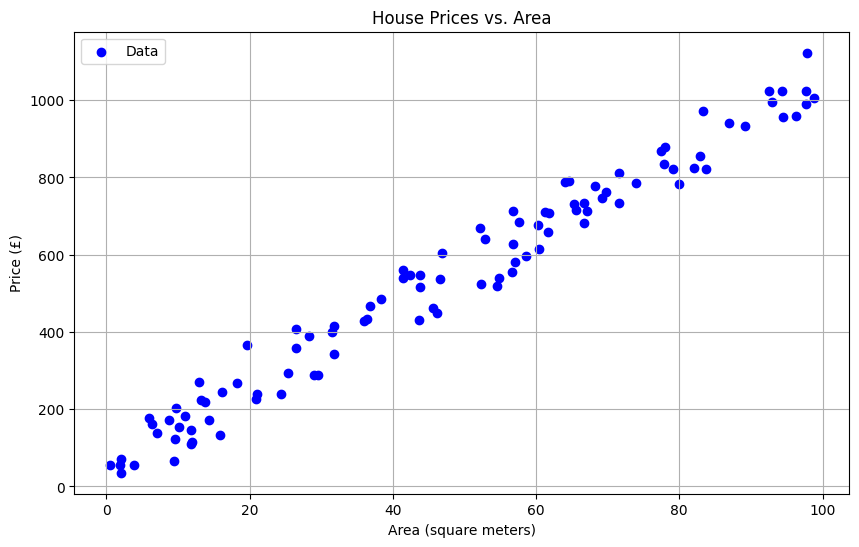

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Setting the random seed for reproducibility
np.random.seed(0)

# Generate random data for house areas (0-100)
area = np.random.uniform(0, 100, 100)

# Define linear relationship: price = a * area + b
a = 10  # slope
b = 50  # intercept
noise = np.random.normal(0, 50, size=area.shape)  # Random noise
prices = a * area + b + noise

# Fit linear regression model
model = LinearRegression()
model.fit(area.reshape(-1, 1), prices)  # Model needs 2D array for features

# Predict prices for the fitted line
line_area = np.linspace(0, 100, 100)
line_prices = model.predict(line_area.reshape(-1, 1))

# Plotting the data and the regression line
plt.figure(figsize=(10, 6))
plt.scatter(area, prices, color='blue', label='Data')
plt.title('House Prices vs. Area')
plt.xlabel('Area (square meters)')
plt.ylabel('Price (£)')
plt.legend()
plt.grid(True)
plt.show()


We can start by just randomly guessing the slope ($\beta_1$) and constant ($\beta_0$) and plotting a line. We can then measure the loss as the vertical distance between the line and each point.

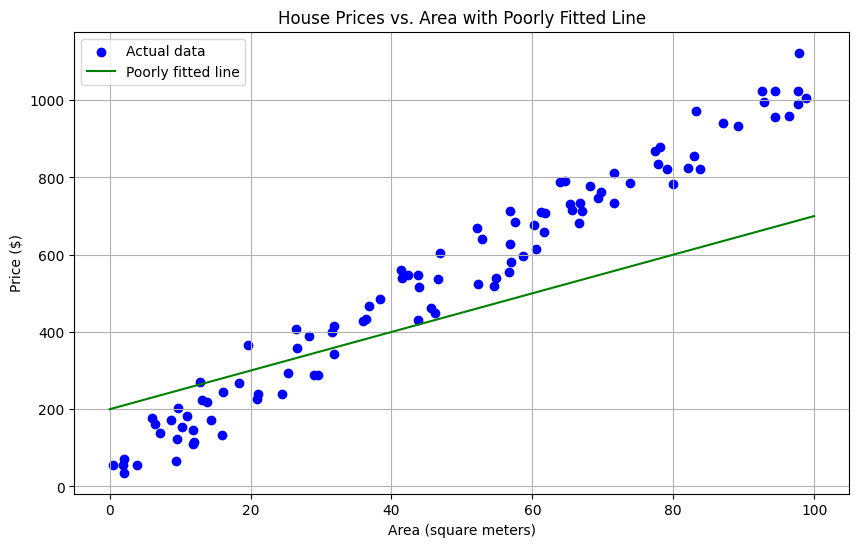

In [ ]:
# @title
poor_slope = 5
poor_intercept = 200

# Calculate values for the poorly fitting line
poor_line_prices = poor_slope * line_area + poor_intercept

# Plotting the data and the poorly fitting line
plt.figure(figsize=(10, 6))
plt.scatter(area, prices, color='blue', label='Actual data')
plt.plot(line_area, poor_line_prices, color='green', label='Poorly fitted line')
plt.title('House Prices vs. Area with Poorly Fitted Line')
plt.xlabel('Area (square meters)')
plt.ylabel('Price ($)')
plt.legend()
plt.grid(True)
plt.show()


To find the best fitting line we want to minimise this loss value. We can do this by iteratively adjusting the model parameters $w_1$ (or $\beta_1$) and $b$ (or $\beta_0$). We can think of their being a loss curve defined by the parameter values and loss values. We want to find the parameter values that minimise that loss (the lowest point on the curve).

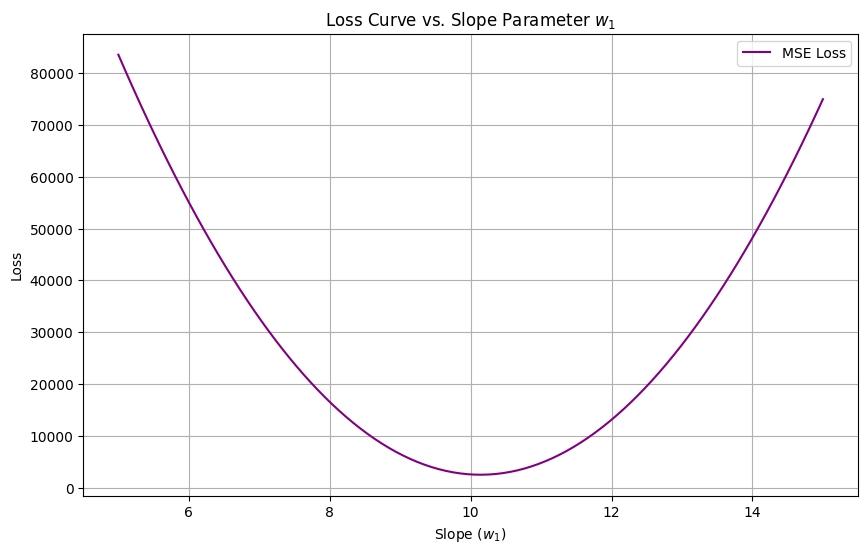

In [ ]:
# @title
import numpy as np
import matplotlib.pyplot as plt

# Re-establishing data for consistency
np.random.seed(0)
area = np.random.uniform(0, 100, 100)
a = 10  # slope
b = 50  # intercept
noise = np.random.normal(0, 50, size=area.shape)
prices = a * area + b + noise

# Calculating MSE for different values of w_1
w1_values = np.linspace(5, 15, 100)  # w_1 values around our optimal slope of 10
mse_losses = []

for w1 in w1_values:
    predicted_prices = w1 * area + b  # Predict prices with varying w1 and fixed intercept
    mse = np.mean((prices - predicted_prices)**2)
    mse_losses.append(mse)

# Plotting the loss curve
plt.figure(figsize=(10, 6))
plt.plot(w1_values, mse_losses, color='purple', label='MSE Loss')
plt.title('Loss Curve vs. Slope Parameter $w_1$')
plt.xlabel('Slope ($w_1$)')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

This will give us a fitted model.

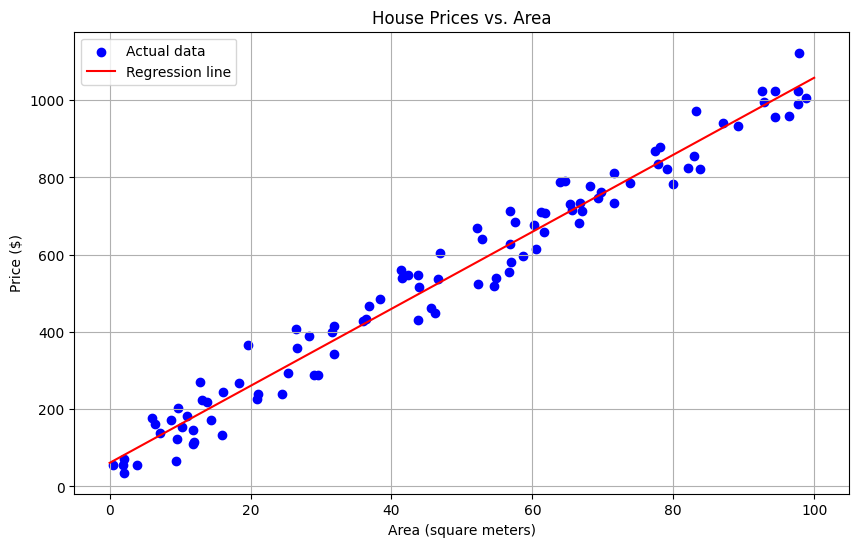

In [ ]:
# @title
np.random.seed(0)

# Generate random data for house areas (0-100)
area = np.random.uniform(0, 100, 100)

# Define linear relationship: price = a * area + b
a = 10  # slope
b = 50  # intercept
noise = np.random.normal(0, 50, size=area.shape)  # Random noise
prices = a * area + b + noise

# Fit linear regression model
model = LinearRegression()
model.fit(area.reshape(-1, 1), prices)  # Model needs 2D array for features

# Predict prices for the fitted line
line_area = np.linspace(0, 100, 100)
line_prices = model.predict(line_area.reshape(-1, 1))

# Plotting the data and the regression line
plt.figure(figsize=(10, 6))
plt.scatter(area, prices, color='blue', label='Actual data')
plt.plot(line_area, line_prices, color='red', label='Regression line')
plt.title('House Prices vs. Area')
plt.xlabel('Area (square meters)')
plt.ylabel('Price ($)')
plt.legend()
plt.grid(True)
plt.show()

While we can add more parameters to produce a model with better predictive power, the relationship between the explanatory variables will always be linear, i.e. a line with 1 variable, a plane with 2 variables, or a hyper-plane with 3 or more.

However, there are many relationships that we want to capture that cannot easily be expressed in linear terms. For instance, if we want to use the pattern of a particular set of pixels to predict whether those pixels belong to a line of text.

**From Linear Regression to Deep Models**

Deep learning relies on models called neural networks. We can think of a linear regression as a neural network with a single computational layer. It has some input nodes, with some relationship (in this case linear) with the output node.

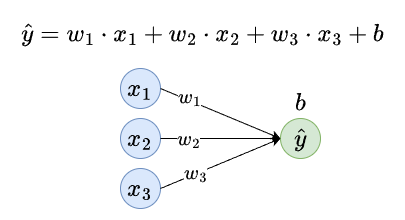

Deep learning takes this model and adds additional computational layers, which allow it to capture complex non-linear relations, for instance a very simple neural network could look like this.

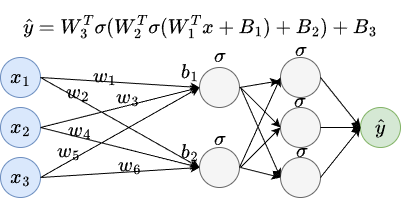

*Note:* For visual clarity I don't show the layer 2 or layer 3 weights or biases. These can be denoted as $W_2$, $B_2$, $W_3$ and $B_3$ respectively (the weight matrix).


Where we still have 3 input parameters, but they are connected to multiple different output nodes by unique sets of weights (slopes) and biases (constants). The outputs are passed through non-linear functions, in this case the sigmoid function $\sigma$, and through multiple layers of computation.

As with the linear regression, we can fit the model by evaluating the loss on our data, finding the slope of our loss function, and then adjusting our model parameters to walk down the steepest slope of that loss function, until we have fitted our model.

In a sense we can think of deep neural networks as universal function approximators. Given enough units and layers they can fit any continuous function, and transform any input into any output.

Recommended:
- [Introduction to Neural Networks](https://www.youtube.com/playlist?list=PLZHQObOWTQDNU6R1_67000Dx_ZCJB-3pi) (Videos 1-4), Credit: Grant Sanderson.
- [Neural Networks from Scratch](https://colab.research.google.com/drive/156k1_W3lQLSvD9cQ64u34yC7e_N04qHg) (Workshop 2 in particular), Credit: Aurelius Noble

**Convolutional Neural Networks**

For structured data like images, where each input has a particular relation to other inputs, we usually use more sophisticated neural network architectures.

Convolutional Neural Networks (CNNs) are used to capture spatial relations in data. The basic building block of a convolutional neural network is convolution.

Convolution works by sliding a filter over an input image, say a 3x3 matrix, and at each location computing the dot product. This results in a feature map that highlights where the filter features occur in the image. Let's take a look.

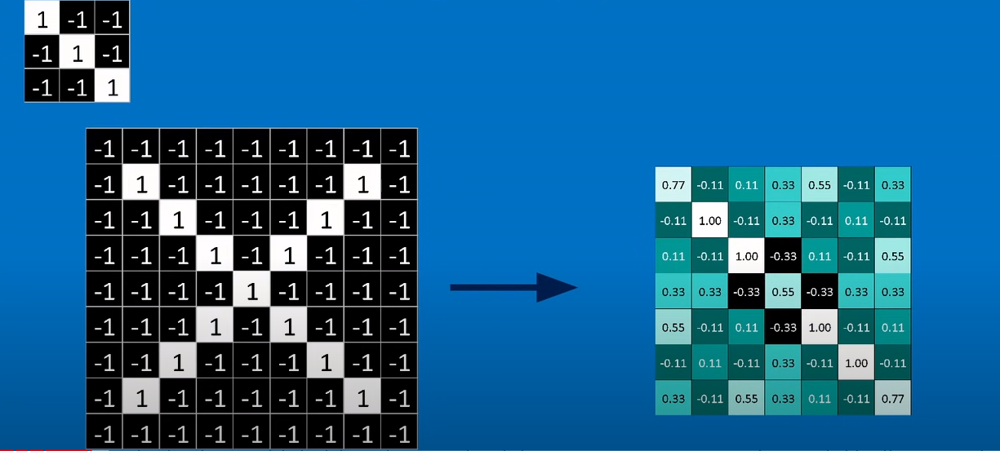

_Image Credit: Brandon Rohrer_

Here we have an image of an X (bottom left). At the top left we have our filter. We slide this across each 3x3 area in the image and calculate the dot product. This results on a feature map (right), we get high values where our filter matches the pattern, and low values where it doesn't.

We can learn the parameter values for our filter matrix using the same algorithm as before, gradient descent, which will help find the optimal filter parameters for feature recognition.

As we add convolutional layers we usually use other operations to reduce the dimensionality of the data. This means we can start by learning local patterns, and eventually recognise global features. Each convolutional layer usually involves: convolution, pooling (a dimensionality reducing algorithm) and then passing through some non-linear `activation' function.

We then pass these into a dense neural network (above) to produce a prediction based on the input pixel values.

Recommended:
- [Convolutional Neural Networks (extended explanation)](https://www.youtube.com/watch?v=JB8T_zN7ZC0&list=PLIljGg4Iv24ZnLxc-PfjYiOgcyiI1Fm5v&index=14), Credit: Brandon Rohrer
- [Convolutional Neural Networks (short explanation)](https://www.youtube.com/watch?v=jDe5BAsT2-Y), Credit: fard1n.
- [Convolutions](https://www.youtube.com/watch?v=KuXjwB4LzSA), Credit: Grant Sanderson


**Transformer Models**

Transformer models process text by first converting words into vector representations called word embeddings. Unlike CNNs that consider relationships between nearby pixels, transformers consider the relationship between each word and every other word in the sequence, as relevant information might be found anywhere.

To efficiently compute these relationships, transformers use an attention mechanism, a separate neural network that assigns relevance scores to each pair of words. The attention mechanism compares the embedding of the current word with the embeddings of all other words using a dot product operation and a softmax function to normalize the scores.

The attention mechanism is applied multiple times (multi-head attention) to capture different types of relationships. The transformer then performs a weighted sum of the word embeddings, where each embedding is multiplied by its relevance score, resulting in a new vector for each word that captures important information from the entire sequence.

These output vectors from the attention mechanism are then passed through a dense neural network for further processing.

Recommended:
- [Transformers (Intuitive)](https://www.youtube.com/watch?v=kWLed8o5M2Y&list=PLIljGg4Iv24ZnLxc-PfjYiOgcyiI1Fm5v&index=42), Credit: Algorithmic Simplicity
- [Transformers (Theoretical)](https://www.youtube.com/playlist?list=PLZHQObOWTQDNU6R1_67000Dx_ZCJB-3pi) (Videos 5-6), Credit: Grant Sanderson

# Pipeline

Let's start by thinking about what our design requirements are for this data. Remember we want it for estimates of social mobility in terms of wealth. Keeping this goal in mind, we can generate several design requirements, which will inform our design and evaluation strategy.

**Design Requirements**

**High Priority**
- Unbiased data
- Linkable data

**Medium Priority**
- Pedagogical
- Flexible

**Low Priority**
- Computionally cheap
- Perfect transcription


Let's look at a sample image.

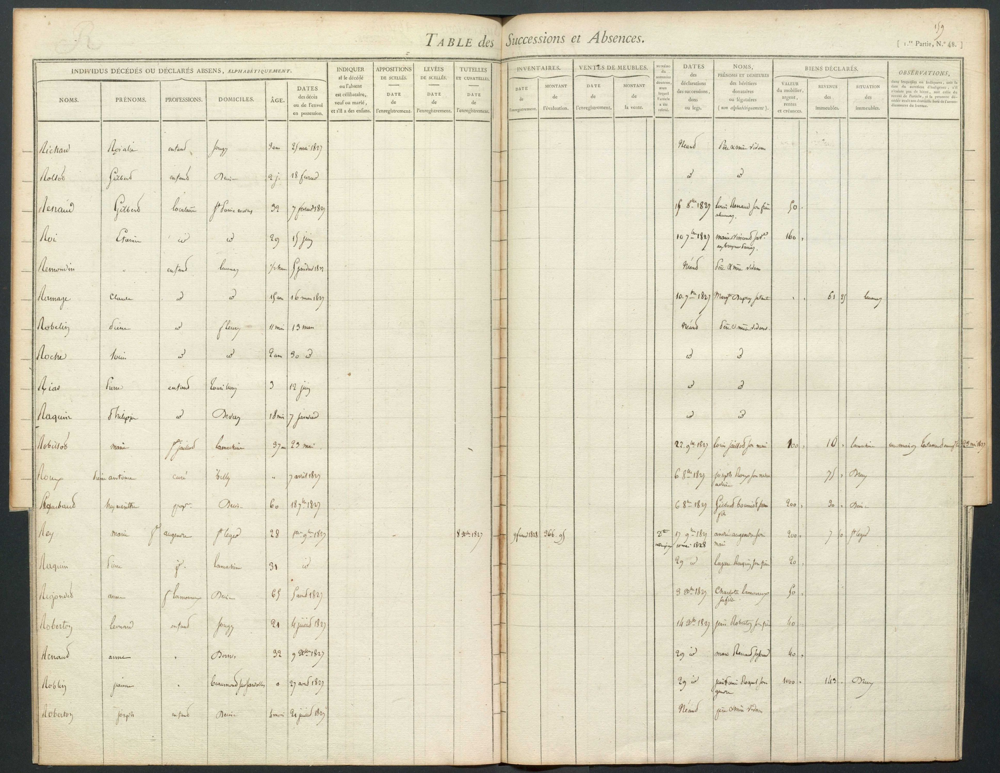

**Pipeline Design**

When designing our pipeline want to think about:
- What does the image look like?
- What do we want to do with our output data?
- How can we evaluate the performance of our pipeline?

Let's start by looking at the image. A basic design process might look like this.

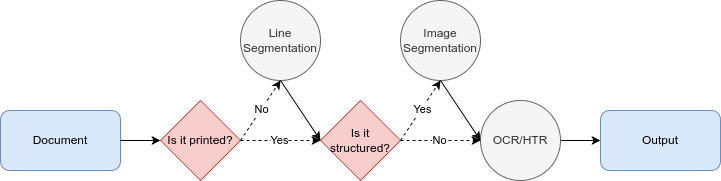

So we will need to do line segmentation, image segmentation and HTR.

Now I want you to look at the page carefully and list features that might be important. Think about details that might make it easier or harder to read the page.

When you feel like you've covered the important details click "Play" on the code cell below to reveal the details I noticed when I looked at this image.

In [ ]:
# @title
text = '''
1. Text is handwritten (except for headers). \n
2. The page is in colour. \n
3. There is a clearly defined header at the top of the page. It is printed. \n
4. There are vertical black lines separating columns. \n
5. There are no line markings separating rows. \n
6. Sometimes there are (faded) vertical lines separating decimal places. \n
7. There is some bleed from the page behind. Especially from columns. \n
8. There are borders around the table. \n
9. Text items sometimes run into adjacent columns. \n
10. Cell items are sometimes written over multiple "lines" in the same row. \n
11. There are large blank spaces on the page. \n
12. There are a large number of rows and columns. They are reasonably distinct. \n
13. The page is generally flat and unwarped. \n
14. The text size can be quite varied. \n
15. The page is well-lit.
'''

print(text)


1. Text is handwritten (except for headers). 

2. The page is in colour. 

3. There is a clearly defined header at the top of the page. It is printed. 

4. There are vertical black lines separating columns. 

5. There are no line markings separating rows. 

6. Sometimes there are (faded) vertical lines separating decimal places. 

7. There is some bleed from the page behind. Especially from columns. 

8. There are borders around the table. 

9. Text items sometimes run into adjacent columns. 

10. Cell items are sometimes written over multiple "lines" in the same row. 

11. There are large blank spaces on the page. 

12. There are a large number of rows and columns. They are reasonably distinct. 

13. The page is generally flat and unwarped. 

14. The text size can be quite varied. 

15. The page is well-lit.



These pieces on information help inform us about which methods might work best, this knowledge is largely developed by experience, but let's look at a few decisions I made.

**HTR**

The varying size of the text, the fact that the corpus includes a large number of different handwritings, and the cursive script mean that this is going to be a difficult task. There are three main libaries used for historical HTR:
- PyLaia (CNN)
- Kaldi (CNN)
- TrOCR (Vision + Text Transformer)

While PyLaia and Kaldi are more light-weight, and will require less computational power, they may struggle with such a varied corpus, and generally get less good performance. They also often require clean-up using language models, making the pipeline more complex.

**Line Segmentation**

While there are some frameworks that support whole page handwritten transcription (e.g. DAN), these still tend not to be as performant. Line segmentation will add significant complexity to the project, but for now is necessary to achieve the best results. There are three main libraries we can use:
- AruNet
- Doc-UFCN
- DHSegment

For this workshop we'll be using Doc-UFCN, primarily because it is the simplest to use.

**Image Segmentation**

The images are reasonably well structured so a variety of approaches are viable. We could use the projection profiles method that we looked at in the last workshop, we could use Hough Lines (see here), or train a custom CNN.

Today we'll be looking at training Doc-UFCN for row and column segmentation. A hough line method could be equally viable, and to achieve the best performance you might want to combine both.

**Evaluation**

Ok, so what do we want to evaluate? We want to be able to examine the performance of each individual step and the entire process, both in terms of accuracy and bias.

_Transcription_

For transcription this is relatively straightforward, we want to know the character error rate and the word error rate. We might also care about the distribution of these errors. For instance: are we mis-transcribing a lot of R's as P's, which might hinder linking; are we missing full stops, which might lead to inaccuracies in wealth.

_Line Segmentation_

During line-segmentation we assign each pixel on the page a value (e.g. of 1) if it is part of a text-line and another value (e.g. 0) if it is not. We can then take all the discrete text-line areas. We want to know what percent of pixels we correctly capture, but also if we have any conjoined or missing boxes.

_Row and Column Segmentation_

For row and column segmentation we are mostly concerned with whether a particular text-line has been assigned to the appropriate row and column.

_End-to-End_

At the end we want to measure the image of the overall process. How accurate are the transcriptions for an entire page? At the individual level what is the CER or WER, how accurate are quantitative variables? We want to know if any variables perform worse. We want to think about if there is any bias in the transcription, for instance, are there more inaccuracies in a particular geographical area, or for a particular social class, arising from differences in scribes.



**Data Splitting**

At each step of the process we will be splitting the data into three sets:
- A training set: used to train the model.
- A validation set: used to find which model performs best.
- A test set: unseen data, to produce final evaluation and see how well model generalises.

It is very important that we don't let data leak between these sets, which will lead to inaccurate evaluation, and mean that the model may not generalise as well as we think.

**Preprocessing**

As in the last workshop, it might be useful to apply pre-processing and data cleaning during various steps in this process. For instance, denoising, equalisation, dewarping.

In the interest of time, we will be implementing the most barebones pipeline possible. There is plenty of scope to improve this pipeline, and you are encouraged to play around with these concepts in your own time.

# Setup

First, make sure to copy this notebook to your Google Drive. This will allow you to edit and run the code.

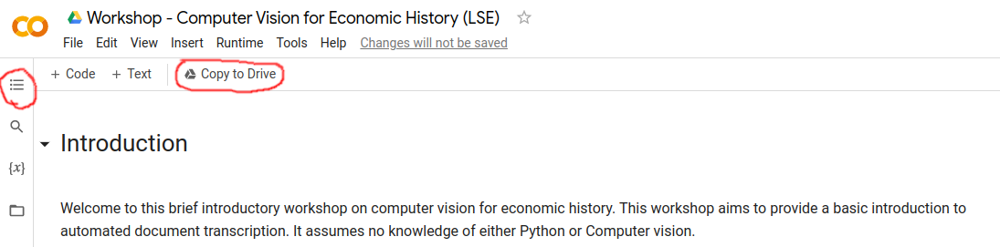

## Hardware

Ok, before we start we need to set-up a few things. We will first need access to a GPU (a particular type of processor) to train deep learning models. Google Colab should give you limited access.

You can change this by clicking Runtime>Change runtime type in the menu at the top.

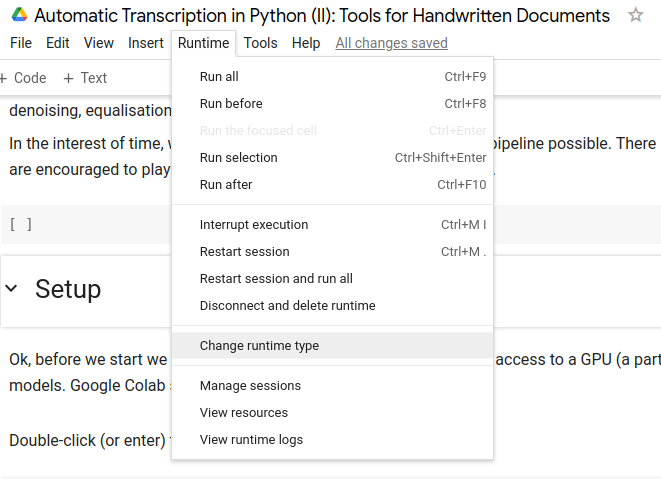

Then click T4 GPU and then save. We can then check what hardware we are running. You will only have limited access to these devices. Run the code cell below, which should print off information about your graphics card.

In [ ]:
%%bash
nvidia-smi

Fri May 10 13:58:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

This should show that we are running a Tesla T4, with CUDA Version 12.x, and that we are currently using 0/16GB of video-RAM.

The next step is to download all of the data and models that we will be using today. I've bundled this up in a .zip file if you run the cell below this will automatically download everything you need. This should take about 5 minutes.

If you want to use these models after the workshop you can find them on GitHub, or you can just download the workshop materials [here](https://www.dropbox.com/scl/fi/eulf95kt0v3r9xpj9xdjp/materials.zip?rlkey=2yb56xmt13cde0n45vrkz1xdh&st=1uulz5z9&dl=0).

## Libraries

Now that you've downloaded all the necessary data, we're going to need to install a few libraries.

This will take a while, the dependencies of these libraries can be complex, and we need to uninstall and reinstall many different libraries.

*Warning: This should take about 3 minutes to run.*

In [ ]:
!pip -q uninstall torch torchvision torchaudio torchtext bigframes transformers gcsfs fsspec huggingface-hub -y
!pip -q install doc-ufcn[training]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 40.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.2/670.2 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 85.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 94.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 89.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 85.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 95.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Data

*Warning: This should take about 2 minutes to download*.

Please click run on the cell below, this will download all the data and models you need for the workshop.

In [ ]:
# @title
from tqdm import tqdm
import requests
import os
import shutil

# URL of the file to download
url = "https://dl.dropboxusercontent.com/scl/fi/tv4tw0oek125whp5u84dr/materials1.zip?rlkey=j840cqfqjzkt05qnqi1cmmudi&dl=1"
response = requests.get(url, stream=True)

# Total size in bytes.
total_size = int(response.headers.get('content-length', 0))
block_size = 1024  # 1 Kibibyte

print("Starting download...")
with open("materials1.zip", "wb") as file, tqdm(
        desc="Downloading materials",
        total=total_size,
        unit='iB',
        unit_scale=True,
        unit_divisor=1024) as bar:
    for data in response.iter_content(block_size):
        file.write(data)
        bar.update(len(data))

print("Download completed.")

print("Unzipping files...")
!unzip -o materials1.zip > /dev/null
print("Files unzipped.")

print("Cleaning up downloaded zip file...")
os.remove('materials1.zip')
shutil.rmtree('/content/sample_data')
print("Cleanup completed.")

Starting download...


Download completed.
Unzipping files...
Files unzipped.
Cleaning up downloaded zip file...
Cleanup completed.


If you look in the file brower on the left, you should now see a number of different directories (you may need to click the refresh icon at the top).

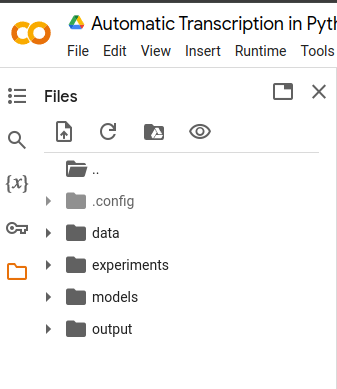

Ok, great! That's everything set up. Now we can start implementing our pipeline. This is split into four major steps:
1. Line Segmentation
2. Row/Column Segmentation
3. Transcription
4. End-to-End

# Line Segmentation

So the first step is line-segmentation. We will need to take our images, label the text-lines, and then use this to train an image segmentation model to recognise the line regions.

We are going to provide binarised versions of our input images (see previous workshop for binarisation methods), and then label them.

The software that we're going to use to label the data is called [CVAT](https://www.cvat.ai/), though many alternatives are available (e.g. LabelBox). To use CVAT all you need to do is create an account. Then you can:

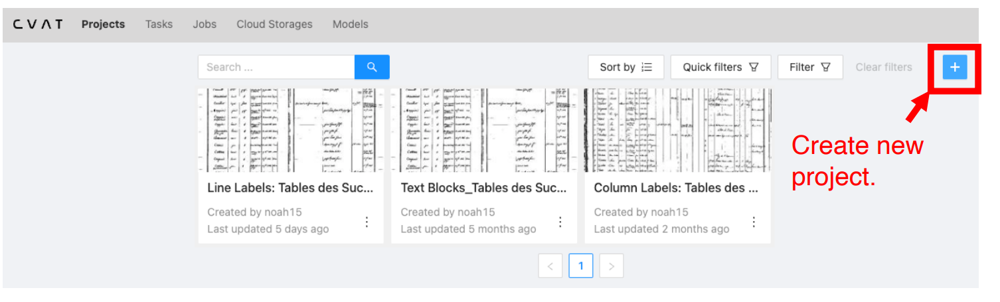

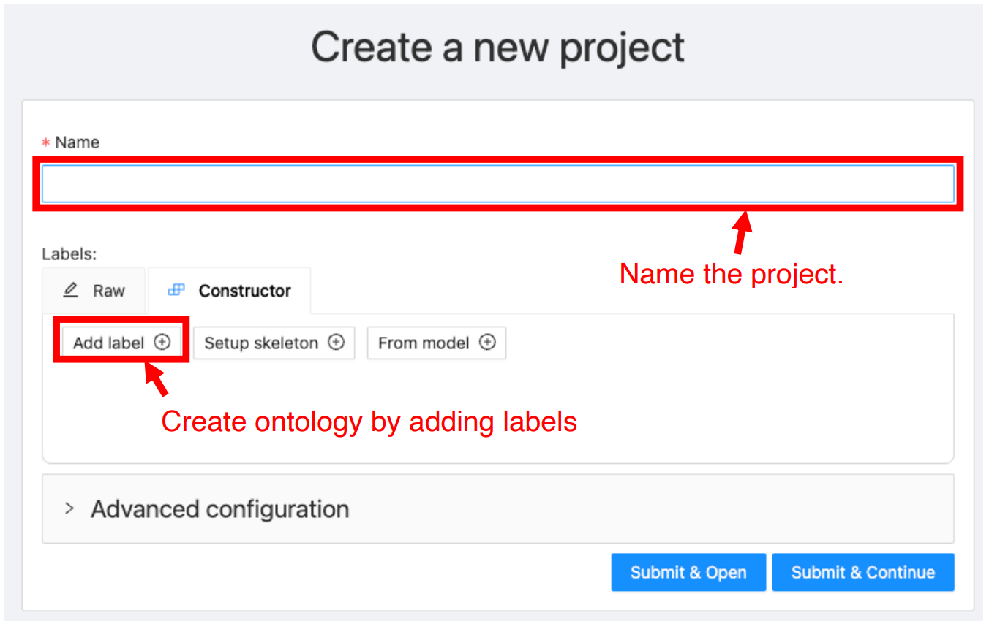

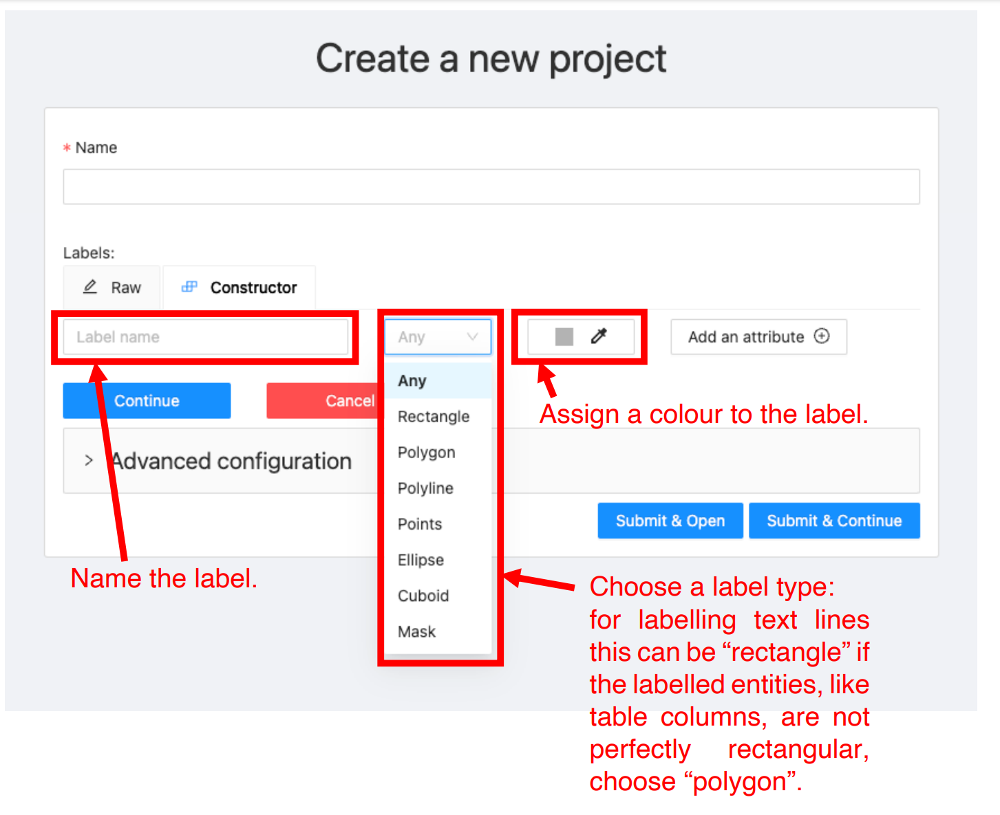

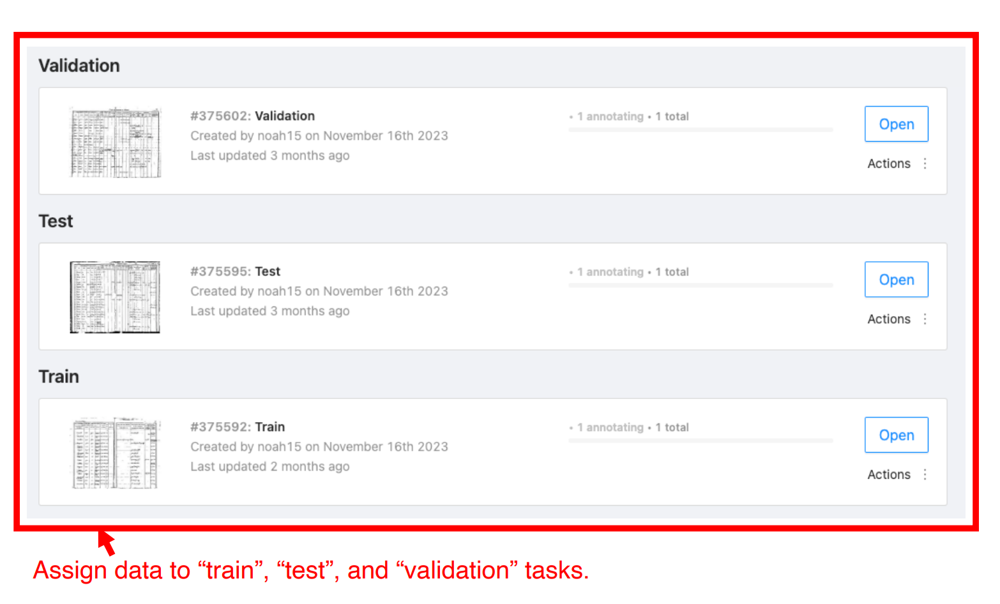

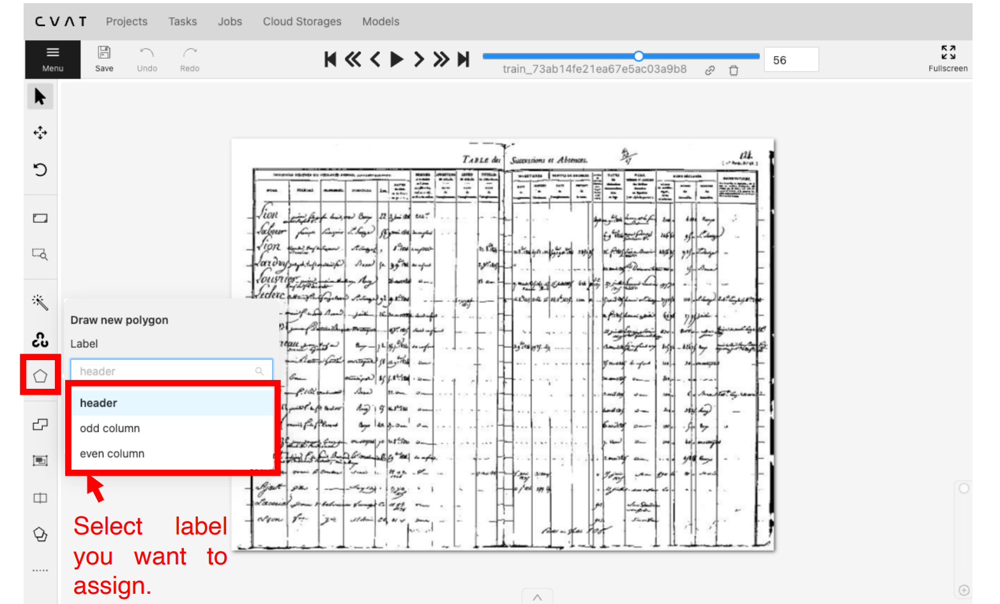

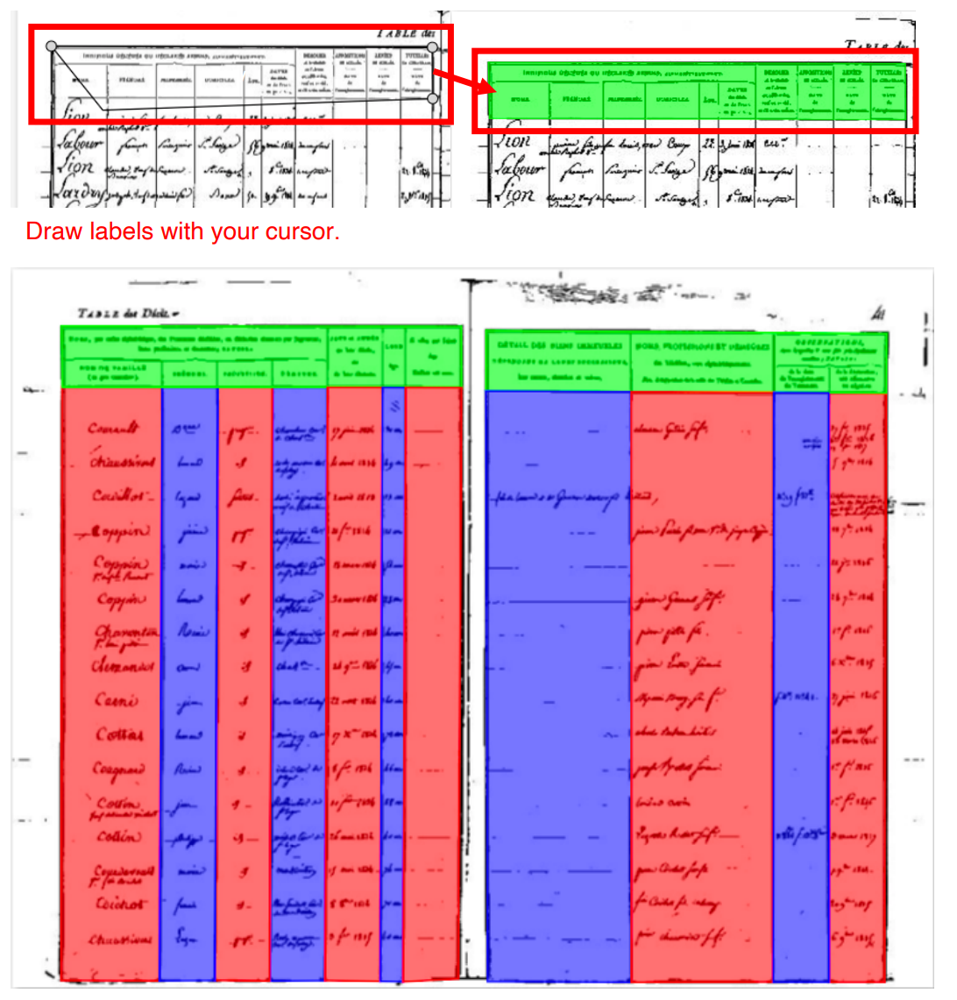

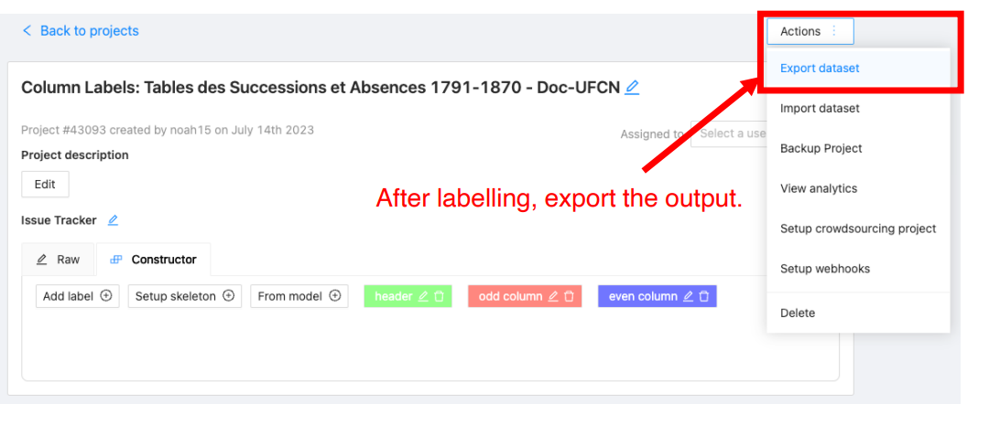

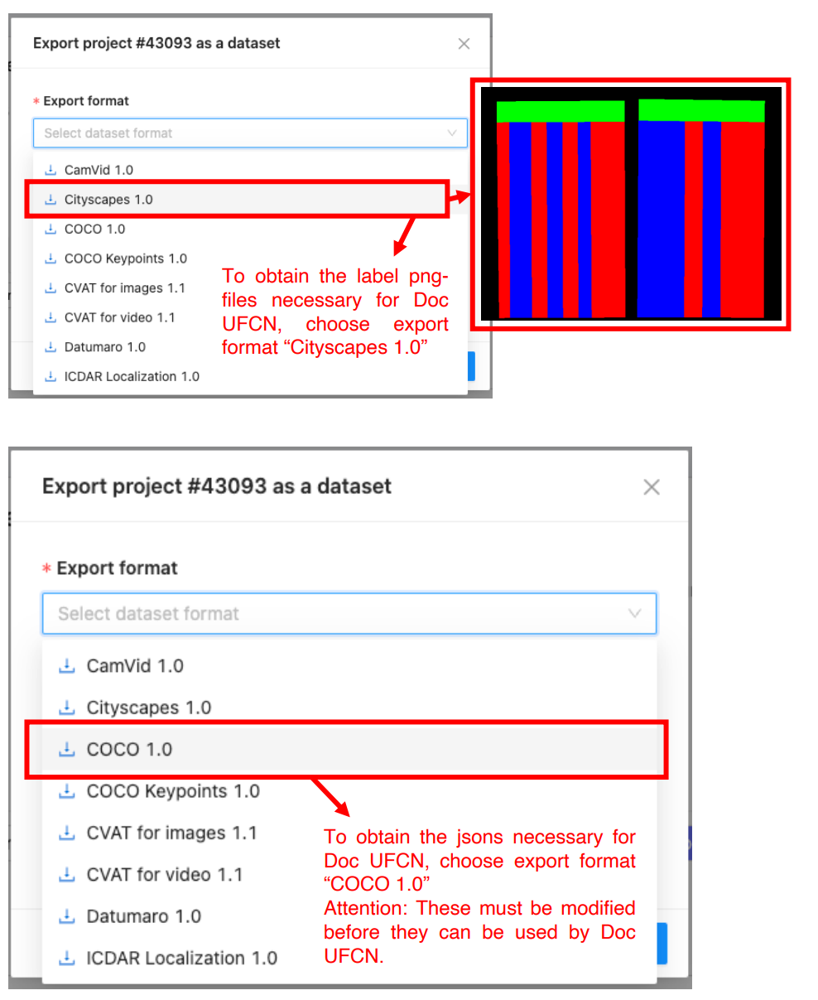

Ok, so now let's look in the data explorer and find what we have.

Navigate to /content/data/lines/ (you can click on this link or use the file explorer).

There you will see the data split into three sets: train, val and test. We produced these by randomly sampling images from the initial corpus, the ratio is around 80:10:10 respectively, and we used around 150 images to train our model.

If you click on the train folder you will find three sub-folders: 'images', 'labels' and 'labels_json'.

The 'images' folder contains the original page images, binarised and resized to a width of 768 pixels (the expected input size for Doc-UFCN).

The 'labels' folder contains image masks for the text-lines. These were outputted by the Cityscapes format of CVAT. If you click on the folder and then double-click one of the files it should open up one of these maps. These can be used for evaluation.

Finally, if you open the 'label_json' folder you will find .json files, with the matching filename. These were outputted by the COCO format of CVAT. If you double-click this you will see this is a .json file, containing a list of "text_line" polygons.

*Note*: COCO and the input format for doc-ufcn differ slightly, so these files are reformatted using a custom-script. Details on this are provided at the end.

## Training a Model

### Configuration

Training a model is simple, once we have these matching images, labels and labels_json, all we need to do is run a training script. We'll be using the `doc-ufcn` library (from [Boillet et al. (2020), 'Multiple Document Datasets Pre-training Improves Text Line Detection With Deep Neural Networks'](https://ieeexplore.ieee.org/abstract/document/9412447)).

Let's navigate to the /content/experiments folder. There should be a sub-folder in here called 'lines'. In there you should see a number of different items. Let's walk through these:
- 'doc_ufcn' and 'tools': libraries used to train the model, these can be found [here](https://gitlab.teklia.com/dla/doc-ufcn).
- 'runs': a folder where we'll store our runs.
- 'runs_final': a folder containing a pre-trained model that I created earlier.
- 'DLA_train_1.log': a text file containing a log of information during the training run.
- 'experiments.csv': a .csv file containing information on experiment setup
- 'experiments_config.json': a .csv file containing configuration parameters for our experiment.
- 'run_dla_experiment.sh': the shell file we need to run to initiate training.

**experiments_config.json**

Let's take a look at configuring the experiment. Double-click the experiments_config.json file.

You should see a number of different items. "classes_names", "classes_colors", "img_size", "learning_rate", "no_of_epochs", "batch_size", etc.

The learning rate refers to how quickly we adjust our model parameters, the number of epochs is how long we run it for, and the batch size is how many images we process in parallel.

Take a moment with your partner to consider what the other parameters might do. Think about the contents of our /contents/data/lines folder. How do these correspond?

**experiments.csv**

Ok, now let's look inside experiments.csv. If you open it up you should see a spreadsheet with the columns: "experiment_name", "steps", "train", "val", "test", "restore_model", "same_classes", "loss".

The "experiment name" column is what the output will be labelled as, the "steps" parameter allows us to select what steps we want to perform, here we are going to normalise our image, run training, run prediction, and run evaluation.

Can you figure out what the other columns do?

### Running Training

Ok, with all this in mind, let's run our training script. This is written as a shell file `.sh`, which is basically a series of commands that we want our computer to execute.

In this instance it is going to run a series of different python files, with different parameters, loaded from our `experiments.csv` and `experiments_config.json`.

*Note*: Finding the optimal parameters or pre-processing steps can be a difficult task, which we will leave aside for today. If you are interested I recommend looking at *Weights & Biases* or *TensorBoard*.

We're going to run this script from the command-line, that is in bash, so let's start by learning some basic bash.

We can call the `cd` command to 'change directory' which will change which folder we are operating in. We can then use the `ls` command to list the files in that directory.

**Exercise**

In the `%%bash` cell below, change the directory to ./experiments/lines and then list the files in that directory. Fill in the `?` to make the code work.

In [ ]:
%%bash
cd ./experiments/lines
ls

DLA_train_1.log
doc_ufcn
experiments_config.json
experiments.csv
run_dla_experiment.sh
runs
runs_final
tools


**Test**

This should list: DLA_train_1.log, doc_ufcn, experiments_config.json, experiments.csv, run_dla_experiment.sh, runs, runs_final, tools

Ok, after we've changed to the `./experiments/lines` directory we can run the `run_dla_experiment.sh` shell file. It takes two input parameters: `-c <experiments_file>` and `-s <slack_message>`.

The `-c` parameter is a path to the experiment file, and the `-s` parameter determines whether it sends us a message (on the platform Slack) when training is complete. We're also going to remove the `runs` directory, to make sure that the output folder is empty when we run the model.

In [ ]:
%%bash
cd ./experiments/lines
rm -r runs
./run_dla_experiment.sh -c experiments.csv -s false


Running experiment 1 with ./tmp/1_exp1.json
2024-05-09 10:53:49,311 - INFO - NumExpr defaulting to 2 threads.
2024-05-09 10:53:52.770519: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-09 10:53:52.770572: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-09 10:53:52.897068: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-09 10:53:53.133842: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations

2024-05-09 10:53:44,444 - INFO - Retrieved 1 experiment configuration from experiments.csv


If we now look within the runs folder, we should find a folder for our experiment `exp1`. There are several different files in here including: our model, our model config, an events log, but also predictions for each of the sets.

Let's take a look at one of the test files:
/content/experiments/lines/runs/exp1/prediction/test/lines/test_01130f7b81f872ea4141d890b56353c8.png

As you can see in just a few minutes this has learned to predict where our text-lines are with reasonable accuracy.

## Evaluation

If you look at the print out from the experiment, or the file /content/experiments/lines/runs/exp1/evaluation/test/lines_results.json you will see a few different statistics concerning the performance of our model.

These are IoU, Precision, Recall, F-score, AP [IOU=0.5], etc.

Let's take a moment to look at what these mean.

- IoU or Intersection over Union measures the overlap between predicted regions (in pixels) and ground truth regions. It is calculated by dividing the intersection of the two areas by the area of their union.
- Precision is the proportion of predictions that are correct. This is the number of true positive predictions divided by the number of positive predictions (both true and false).
- Recall is the proportion of positive pixels that were correctly identified by our model. It is the number of true positive predictions divided by the total number of actual positives (both true positives and false negatives).
- The F1 score is the harmonic mean of precision and recall.

So far these all provide pixel level metrics. They measure whether a particular pixel is correctly identified as belonging to the text-line class or not. However, this comes with some issues. We really care about object-level metrics. That is, we care about whether each of our text-lines is correct.

We can image a scenario where we have two text-boxes separated by a single row of pixels. If we falsely predict that the row of pixels above the top text-box belongs to the text-line class, this will give them same pixel-level metrics as if we predict the row below that text-box belong to the text-line. However, in the first instance both boxes would still be mostly correct. Whereas in the second instance we'd have one conjoined box which is an inaccurate representation of both of the ground-truth boxes.

An evaluation approach that fixes this is presented by [Boillet et al. (2022)](https://doi.org/10.1007/s10032-022-00395-7).

AP@IoU calculates an object level Average Precision by:
1. Pairing each ground-truth object with a predicted object based on their IoU score, ensuring each object has at most one match.
2. Ranking the paired objects by the model's confidence score for each prediction.
3. For each rank value $k$ we then predict a Precision and Recall score based on whether the prediction for the object is above a specific IoU threshold $t$. So the precision is the number of object predictions above rank $k$ that have an IoU over the threshold, out of the total number of predicted objects above rank $k$. The Recall is the proportion of ground truth objects that have true predictions (IoU over threshold) above rank $k$.
4. We then can calculate a Precision-Recall curve for each rank $k$, and an Average Precision (AP) by averaging the precision across different recall levels.
5. This gives us an AP score at the object level for a specific IoU threshold.
6. The AP@[0.5,0.95] calculates the average over a range of IoU values.

Here we can see that while the IoU score is not that bad, at 0.62 (because most of the pixels captured belong to our target ground-truth pixels), the AP, especially at the higher IoU thresholds is quite low. So we are only identify a small number of correct boxes (defined by a minium IoU).

## Inference

Ok, let's now load up a model I trained previously. There isn't any significant difference in how this model was trained, just it was trained for longer and at a slower rate.

In [ ]:
import torch
from doc_ufcn.main import DocUFCN
from doc_ufcn import models
import copy

Ok, one of the first things we want to do when using these deep learning models is make sure they are loaded on our GPU (rather than on the CPU), which will be much slower at running these models.

We can change to the GPU with `torch.device("cuda:0")` and we can check if the GPU is available with `torch.cuda_is_available()`.

**Exercise**

Write a short script that sets the device to `"cuda:0"` if it's available and `"cpu"` if not.

In [ ]:
if torch.cuda.is_available():
  device = torch.device("cuda:0")
else:
  device= torch.device("cpu")
print(f"Using: {device}")

Using: cuda:0


Ok, now we want to load the model. We can load the model with the `DocUFCN()` function loaded above which takes the parameters: number of classes, image size (maximum dimension), and device.

**Exercise**

Create a variable model, by calling the DocUFCN function with the correct parameters. We have two classes (text-line and background), the image size is 768 (the width), and we have just saved our device to the variable `device`.

In [ ]:
model = DocUFCN(2, 768, device)

Ok, now we need to load up the model by providing the path to the model and a set of parameters (these represent the mean values and standard deviation for each colour channel). (If you want you can also look at the evaluation of this model, in the same directory).

In [ ]:
model.load('/content/experiments/lines/runs_final/exp38/model.pth', mean=[228, 228, 228], std=[71, 71, 71])

Let's load up an image and try this out.

We'll load up a binary image to run the model on (as this is what we trained on), and then use the predictions on the original image.

Both have the same filename, but are read from different directories (you can find these in the file explorer).

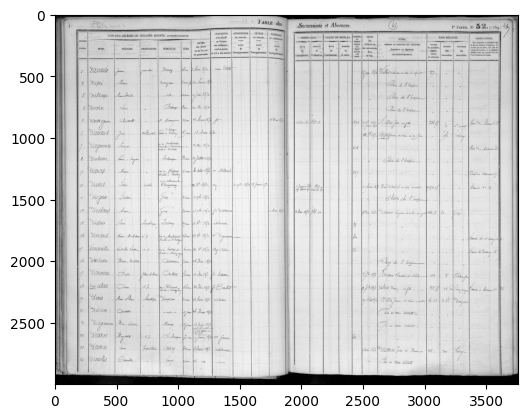

In [ ]:
import cv2
import matplotlib.pyplot as plt

filename = 'test_01130f7b81f872ea4141d890b56353c8.jpg'
image = cv2.imread(f'data/images/{filename}')
image_binary = cv2.imread(f'data/images_binary/{filename}')

plt.imshow(image)

To run the model all we need to do is run `model.predict(image)`. This will produce a list of polygons, probabilities, a mask image and a copy of the original image with annotated text lines.

In [ ]:
polygons, probabilities, mask, overlap = model.predict(
    image_binary, raw_output=True, mask_output=True, overlap_output=True
)


Let's plot the annotated image `overlap`.

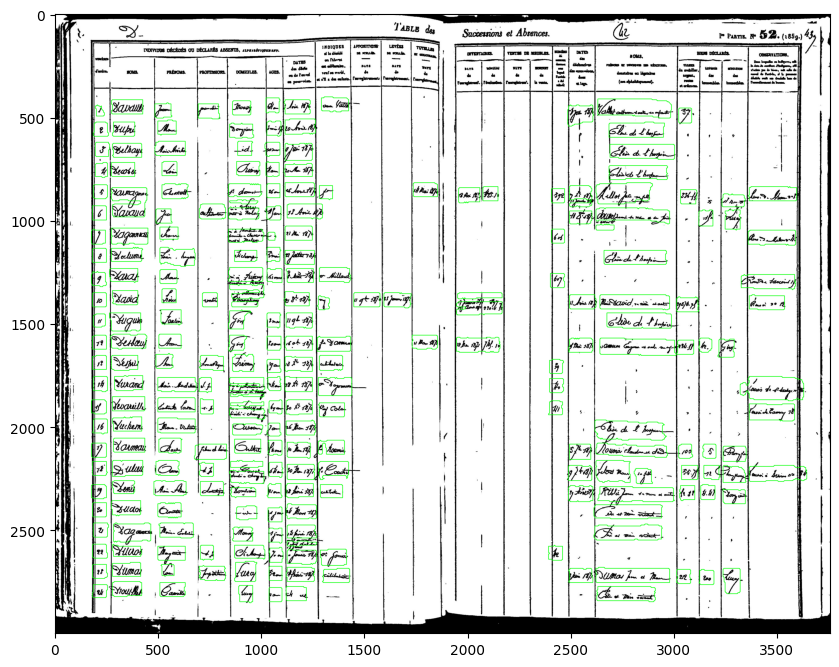

In [ ]:
plt.figure(figsize=(10, 14))
plt.imshow(overlap, cmap="gray")

Ok, now let's take a look at the `polygons` object, this contains all the information we need about text-lines. Using this, we need to create a function that extracts a sub-image for each text-line.

**Exercise**

We want to look inside the `polygons` object so that we can figure out how to convert it into a bounding box.

1. Find out what type of object `polygons` is. You can do this with the `type()` function.

In [ ]:
type(polygons)

dict

2. Ok now we know what type it is we can begin to figure out how to index it.

Remember:
- You can index lists simply with the `list[i]` notation.
- You can index dictionaries with the `dictionary['key']` notation, and you can find the keys with `dictionary.keys()`.

Find out how to index the object.

In [ ]:
polygons.keys()

dict_keys([1])

In [ ]:
polygons[1]

[{'confidence': 0.95,
  'polygon': [(1306, 401),
   (1301, 406),
   (1291, 406),
   (1291, 464),
   (1296, 469),
   (1330, 469),
   (1335, 474),
   (1345, 474),
   (1350, 469),
   (1359, 469),
   (1364, 474),
   (1384, 474),
   (1389, 469),
   (1423, 469),
   (1423, 415),
   (1413, 406),
   (1350, 406),
   (1345, 401)]},
 {'confidence': 0.96,
  'polygon': [(1022, 406),
   (1022, 474),
   (1027, 479),
   (1032, 479),
   (1037, 474),
   (1066, 474),
   (1071, 479),
   (1081, 479),
   (1086, 474),
   (1086, 425),
   (1090, 420),
   (1090, 415),
   (1086, 411),
   (1086, 406)]},
 {'confidence': 0.96,
  'polygon': [(2631, 411),
   (2631, 489),
   (2798, 489),
   (2803, 494),
   (2807, 489),
   (2812, 494),
   (2896, 494),
   (2900, 499),
   (2925, 499),
   (2930, 504),
   (2979, 504),
   (2984, 499),
   (2984, 469),
   (2988, 464),
   (2988, 440),
   (2974, 425),
   (2969, 425),
   (2964, 420),
   (2920, 420),
   (2915, 415),
   (2896, 415),
   (2891, 411)]},
 {'confidence': 0.98,
  'polygo

Ok, this should print out a long list of `polygon_info` objects, each one in our `class` index of `1` (which here corresponds to the `text_line` class.

Let's save `polygons[1]` as textline_polygons and then print out the 61th item (remember Python is 0-indexed).

In [ ]:
textline_polygons = polygons[1]
textline_polygons[60]

{'confidence': 0.97,
 'polygon': [(1120, 1027),
  (1115, 1032),
  (1115, 1096),
  (1247, 1096),
  (1247, 1032),
  (1242, 1027)]}

Ok great, this should output a dictionary containing two items, a `confidence` score, and a `polygon`. The confidence score refers to the model's confidence that there is a text-line polygon at this location. The `polygon` contains a list of `tuples` (a form of list), containing x,y coordinates for each point on the polygon.

Let's save this first item in `textline_polygons` as `polygon`. Remember we need to first access the 61st item of the `list` `textline_polygons` and then access the `polygon` dictionary item within it. Save it to a variable `polygon`.



In [ ]:
polygon = textline_polygons[60]['polygon']
polygon

[(1120, 1027),
 (1115, 1032),
 (1115, 1096),
 (1247, 1096),
 (1247, 1032),
 (1242, 1027)]

Ok, we are now going to find the bounding box around this `polygon`. To do so, we need to first convert it into an `array` type object, which we can do with `np.array(object)`, and then call the `cv2.boundingRect(array)` function on it, to output the x and y coordinates, and width and height.

In [ ]:
import numpy as np
import cv2

polygon_arr = np.array(polygon)
x, y, width, height = cv2.boundingRect(polygon_arr)
print(f'x: {x}, y: {y}, width: {width}, height: {height}')

x: 1115, y: 1027, width: 133, height: 70


Ok great, we can now use this box to index the image, we can index an image with `image[y1:y2, x1:x2]`, where `x1` is the left most x-coord, `x2` is the right-most, `y1` is the top y-coord, and `y2` is the bottom.

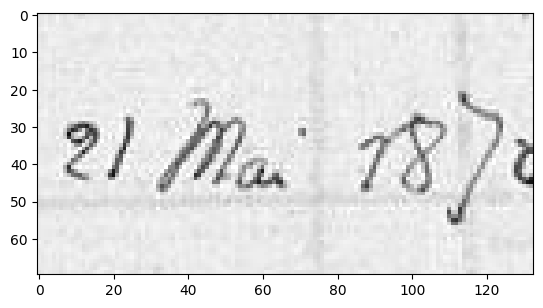

In [ ]:
sub_image = image[y:y+height, x:x+width]
plt.imshow(sub_image)

Hopefully you should see an image saying "21 mai 1870" (if not, check that the list was 0-indexed). We now have everything we need to convert our predictions into text-line images. Let's put it all together.

In [ ]:
def extract_textlines(image, polygons, output_dir, filename):
  textline_polygons = polygons[1]
  base_filename = os.path.splitext(filename)[0]
  output_subfolder = os.path.join(output_dir, base_filename)
  os.makedirs(output_subfolder, exist_ok=True)

  for polygon_info in textline_polygons:
    polygon = polygon_info['polygon']
    polygon_arr = np.array(polygon_info['polygon'])
    x, y, w, h = cv2.boundingRect(polygon_arr)
    sub_image = image[y:y+h, x:x+w]

    key = f"y{y}_x{x}_w{w}_h{h}"

    output_filename = f"{base_filename}_{key}.png"
    output_path = os.path.join(output_subfolder, output_filename)
    cv2.imwrite(output_path, sub_image)

I've added a few lines of code to add identifiers to each text-line and save them:
- `key = f"y{y}_x{x}_w{w}_h{h}"` creates a key variable which is an ID derived from the position of the box.
- `base_filename = os.path.splitext(filename)[0]` extracts the name of our input file, without the file extension (e.g. `.png` or `.jpg`.
- `output_filename = f"{base_filename}_{key}.png"` creates a new `output_filename` for each text-line, by inserting the key before the file extension.
- `output_path = os.path.join(output_subfolder, output_filename)` joins this with the path to an output directory.
- `cv2.imwrite(output_path, sub_image)` writes the sub-image to this path.

Run the line below, this should output the text-lines to the folder `/output/text_lines`.

*Note:* Remember we already set `filename = 'test_01130f7b81f872ea4141d890b56353c8.jpg'`.

In [ ]:
extract_textlines(image, polygons, output_dir='output/text_lines/', filename=filename)

Great. That's everything you need. Now all you need to do is run the model inference function on each image and then run this function on the output polygons.

If you look in `/output/text_lines` you should find a folder for this image, inside the folder you should find a sub-image for each text-line.

*Note*: You can get a list of all files in a directory with `os.listdir(directory)`.

**Further Material**

There are several ways this could be improved. One thing to consider is whether you want to add some padding (i.e. extra pixels) to the edge of the text-line, to make sure you don't crop it too much.

In the section below feel free to experiment with different ideas, here are a few to try out:
- Static padding: adding a few pixels around each text-line image.
- Dynamic padding: adding pixels depending on the size (or contents) of the box.
- Multiple pages: create a function that automatically runs through all the pages, calling the model inference and then the text-line segmentation.

# Page Segmentation

Ok, now that we've segmented the image into text-lines we want to assign each of these text-lines into rows and columns. There are a few different ways of doing this.

We could use projection profiles (as in the last workshop), however these are relatively inflexible, and might not perform well with such a varied corpus.

We could use hough lines, which can be [implemented relatively easily](https://docs.opencv.org/3.4/d9/db0/tutorial_hough_lines.html). These are more flexible, and work well where text is clearly in rows and columns (which is the case for most of ours). This will also be cheaper to run.

We could use Convolutional Nerual Networks (CNN), these are the most flexible, though they might not perform so well in areas where we have large blank spaces.

For this workshop, we'll be using the same CNN as before, `doc-ufcn`
**Recommended**:

[Hough Lines](https://www.youtube.com/watch?v=XRBc_xkZREg), Credit: Shree Nayar

## Training



These models have been trained in exactly the same way as the previous 'text-line' model. The only difference is that they have been trained on four classes: 'background', 'header', 'odd_column', 'even_column' or the equivalent for rows.

You can find the configuration and data used to train these models in the 'experiments' and 'data' folders. You will see the layout is exactly the same, except the `experiments_config.json` file is different, and the contents of the `labels_json` files in the data folders now contain all four classes (see the CVAT guide at the top for info on how to add classes).

We're not going to go through training again, we'll just load up the models I trained earlier. If you want to try training this models, this is left as an optional exercise later.

## Inference

Let's start by loading up our row and column detection models. Again, these are in the `runs_final` folder of the `rows` and `columns` experiments.


In [ ]:
model_row_path = 'experiments/rows/runs_final/exp8/model.pth'
model_row = DocUFCN(4, 768, device)
model_row.load(model_row_path, [228, 228, 228], [71, 71, 71])

model_col_path = 'experiments/columns/runs_final/exp14/model.pth'
model_col = DocUFCN(4, 768, device)
model_col.load(model_col_path, [228, 228, 228], [71, 71, 71])

Now let's run the models, but save our polygons to `polygons_row` and `polygons_col`.

In [ ]:
polygons_row, probabilities, mask, overlap = model_row.predict(
    image, raw_output=True, mask_output=True, overlap_output=False
)

polygons_col, probabilities, mask, overlap = model_col.predict(
    image, raw_output=True, mask_output=True, overlap_output=False
)

Let's now run a plotting function to look at our predictions.

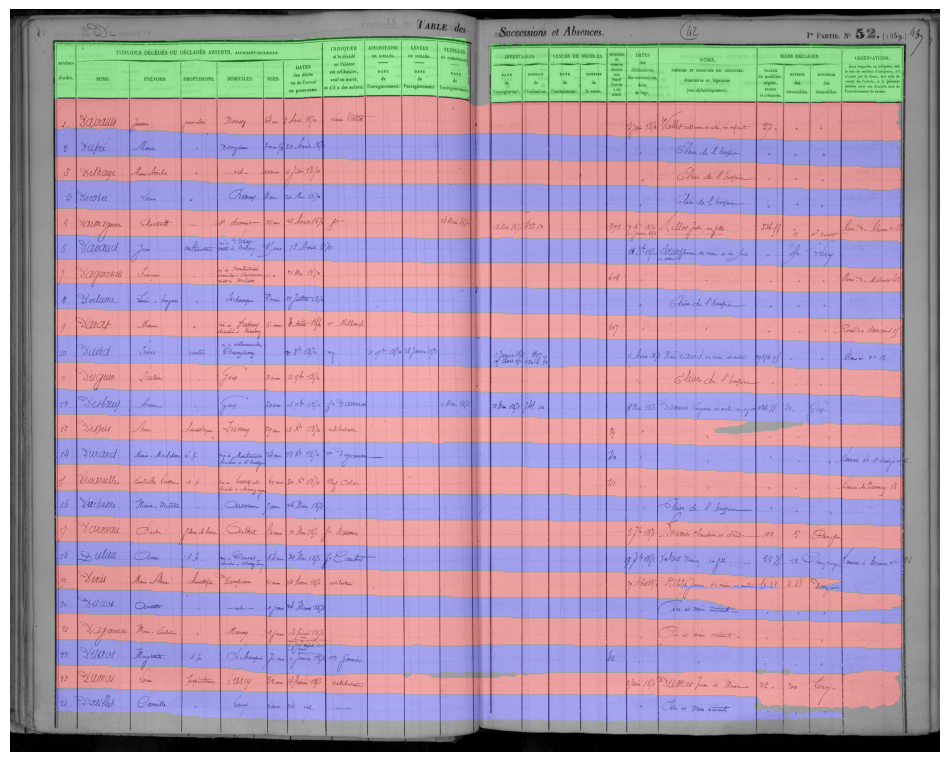

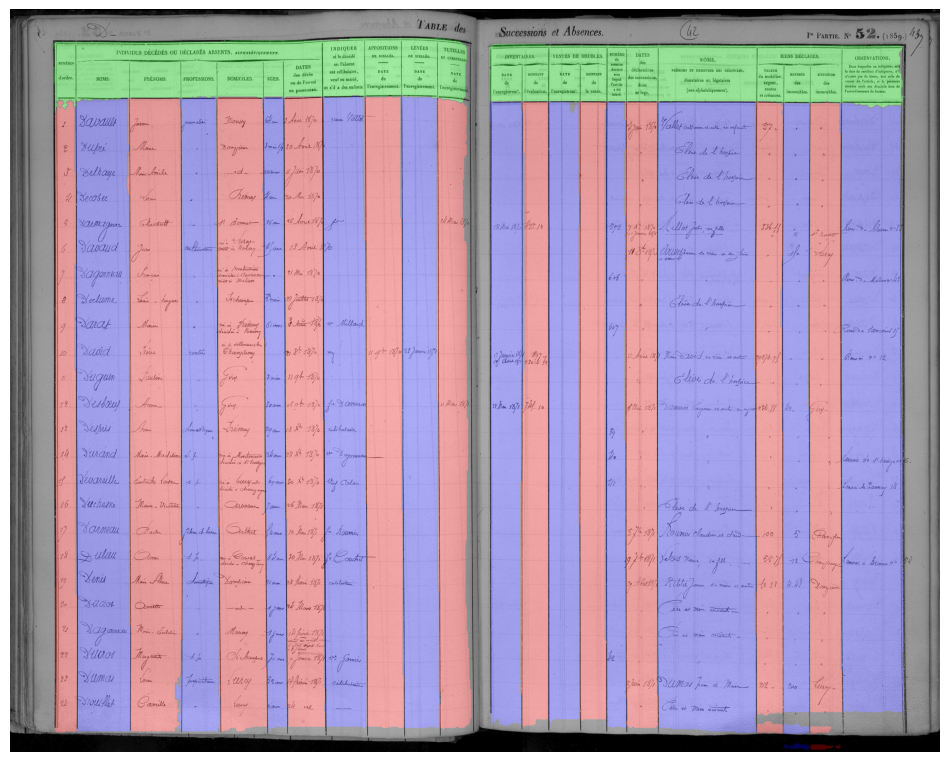

In [ ]:
# @title
def plot_polygons(polygons, image):
    colors = {1: (0, 255, 0), 2: (0, 0, 255), 3: (255, 0, 0)}

    # Create an overlay to draw the polygons on
    overlay = np.zeros_like(image)

    # Iterate through the dictionary and draw filled polygons with reduced opacity
    for key, value in polygons.items():
        color = colors.get(key, (255, 255, 255))  # Default to white if key not found
        for item in value:
            polygon = item['polygon']
            cv2.fillPoly(overlay, [np.array(polygon, dtype=np.int32)], color=color)

    # Blend the overlay with the original image
    alpha = 0.3  # opacity level
    image = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

    # Display the image using Matplotlib
    plt.figure(figsize=(12, 14))
    plt.axis('off')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

plot_polygons(polygons_row, image)
plot_polygons(polygons_col, image)


Ok, let's start by taking a look inside these polygons objects. If you recall from earlier, these are dictionaries. So let's start by taking a look at their keys.

**Exercise**

Print the keys of the `polygons_row` dictionary.

In [ ]:
polygons_row.keys()

dict_keys([1, 2, 3])

Ok perfect, we can see this contains three keys `[1, 2, 3]`. Now we want to find what classes these correspond to.

If we open /experiments/rows/experiments_config.json we can see that this contains four classes, `["background", "header", "odd line", "even line"]`, so "header" is at index 1, "odd line" at index 2, etc.

However, we don't really care about odd and even lines, what we really want to do is combine all of these into a single list of row polygons.

So let's write a function that iterates through a list of keys, and for each key add all items in that key to a single list.

**Hint**: We can achieve this with the `.extend()` method, which takes a list and adds the elements of that list to another list. For instance

In [ ]:
fruits = ['apple', 'banana']
print(f'fruits: {fruits}')

more_fruits = ['orange', 'grape']
fruits.extend(more_fruits)
print(f'fruits: {fruits}')


fruits: ['apple', 'banana']
fruits: ['apple', 'banana', 'orange', 'grape']


**Exercise**

Create a function `combine_polygons()` that takes a polygons object and a list of keys. It should iterate through those keys and add all polygons in that key to a list of combined polygons.

In [ ]:
def combine_polygons(polygons, keys):
  combined_polygons = []

  for key in keys:
    combined_polygons.extend(polygons[key])

  return combined_polygons


We can then call this on our column or row polygons, with the keys for odd and even row or column.

In [ ]:
polygons_col_unified = combine_polygons(polygons_col, [2,3])
polygons_row_unified = combine_polygons(polygons_row, [2,3])

This should now print a single list of polygon info objects, with the confidence and polygon for each.

In [ ]:
print(polygons_row_unified)

[{'confidence': 0.98, 'polygon': [(1413, 352), (1408, 357), (1208, 357), (1203, 362), (1198, 357), (1193, 362), (1188, 357), (1183, 362), (190, 362), (190, 367), (185, 371), (181, 367), (181, 371), (176, 376), (181, 381), (181, 479), (185, 479), (190, 484), (205, 484), (210, 479), (225, 479), (229, 474), (239, 474), (244, 479), (342, 479), (347, 484), (352, 479), (357, 484), (366, 484), (371, 479), (430, 479), (435, 484), (508, 484), (513, 489), (635, 489), (640, 494), (704, 494), (709, 499), (831, 499), (836, 504), (841, 499), (880, 499), (885, 504), (895, 504), (900, 499), (905, 504), (1839, 504), (1844, 499), (1849, 504), (1854, 499), (1858, 504), (1868, 504), (1873, 499), (1878, 504), (1883, 499), (1946, 499), (1951, 504), (1956, 504), (1961, 499), (2123, 499), (2127, 504), (2240, 504), (2245, 508), (2436, 508), (2441, 513), (2670, 513), (2675, 518), (2851, 518), (2856, 523), (3121, 523), (3125, 528), (3536, 528), (3541, 533), (3546, 533), (3551, 528), (3595, 528), (3600, 523), (36

As for the text-lines, we can convert this into bounding boxes.

**Exercise**

As with the text-lines, you should write a function that takes the polygons object and finds the bounding boxes. This time we will also filter for boxes over a certain size, and append them to a list that we'll return.

In [ ]:
def get_bounding_boxes(polygons):
    bounding_boxes = []

    for polygon_info in polygons:
        polygon = polygon_info['polygon']
        polygon_arr = np.array(polygon)
        x, y, w, h = cv2.boundingRect(polygon_arr)

        if w > 2000 or h > 2000:
            bounding_boxes.append((x, y, w, h))

    return bounding_boxes

We can then run this to get a list of bounding boxes.

In [ ]:
bbox_col = get_bounding_boxes(polygons_col_unified)
bbox_row = get_bounding_boxes(polygons_row_unified)

This should print a list of tuples each containing four items, the left-x position, the top-y position, and the width and the height of each box.

In [ ]:
print(bbox_col)

[(1433, 352, 157, 2551), (836, 357, 202, 2560), (1110, 357, 162, 2541), (474, 362, 221, 2555), (1726, 362, 138, 2546), (181, 367, 89, 2555), (2064, 376, 109, 2522), (2299, 376, 108, 2497), (2485, 376, 133, 2527), (3008, 376, 114, 2478), (3228, 376, 133, 2463), (1262, 352, 177, 2551), (1580, 352, 157, 2551), (670, 357, 177, 2560), (1022, 357, 99, 2560), (264, 362, 221, 2560), (1937, 376, 138, 2517), (2176, 376, 124, 2517), (2406, 376, 84, 2527), (2617, 376, 397, 2546), (3116, 376, 113, 2463), (3355, 381, 256, 2458)]


**Exercise**

Ok, now we are going to implement a function that goes through each of these bounding boxes, makes sure they don't overlap and adjusts them to fill the page. First of all we want to sort the bounding boxes depending on whether we are looking across the y or x axis.

We'll import the `itemgetter` function, which allows us to retrieve particular indices from the tuples for our sorting operation, here we want index 1 for rows (i.e. the y coordinate) and index 0 for rows (i.e. the x coordinate). The `.sort` method will then sort that list depending on the items at that index.

We can then move through the boxes along this access.

Try filling in the code below:

In [ ]:
from operator import itemgetter

orientation = 'row'
boxes = bbox_row

if orientation == 'row':
  axis = 1
  boxes.sort(key=itemgetter(1))

elif orientation =='column':
  axis = 0
  boxes.sort(key=itemgetter(0))

Now we want to iterate through the list of boxes, we'll start by defining a list containing the first box, and then iterate through the rest to check for overlaps. We'll set this first box to the last box in the list.

In [ ]:
adjusted_boxes = boxes[0:1]
previous_box = adjusted_boxes[-1]

adjusted_boxes

[(176, 352, 3425, 182)]

This should print the first row box, containing `[(176, 352, 3425, 182)]`. Now all we need to do is cycle through the rest of the boxes and check how much they are overlapping.

We can index the start position (in this case the y-coordinate) with `previous_box[axis]` (which is indexed as 1 for row and 0 for column) and the width or height as this value + 2.

This means that the bottom (or generically end) co-ordinate of this box is just the x+width or y+height.

In [ ]:
previous_box_end = previous_box[axis] + previous_box[axis + 2]

Now we can loop through the rest of the boxes, the top of which is just `current_box[axis]`, and we can check whether the x or y coordinate of the previous box is higher, and by how much (i.e. overlap). We can then adjust the second box by that amount, and add the adjusted box to our list of boxes, adjusting either the third or fourth item depending on whether we are doing rows or columns.

In [ ]:
for current_box in boxes[1:]:
  current_box_start = current_box[axis]

  if previous_box_end > current_box_start:
    overlap = previous_box_end - current_box_start
    new_size = previous_box[axis + 2] - overlap

    adjusted_boxes[-1] = (
            previous_box[0],
            previous_box[1],
            new_size if orientation == 'column' else previous_box[2],
            previous_box[3] if orientation == 'column' else new_size
        )

    current_box_start = previous_box[axis] + new_size
  else:
    current_box_start = previous_box_end


Ok, great! This is all the logic we need, with a couple of minor adjustments I've implemented this function in full below (it now takes a OVERLAP_THRESHOLD parameter, which only looks at overlaps of a certain amount).

In [ ]:
def adjust_bounding_boxes(boxes, orientation):
  OVERLAP_THRESHOLD = 0.1
  if orientation == 'row':
    axis = 1
    boxes.sort(key=itemgetter(1))

  elif orientation =='column':
    axis = 0
    boxes.sort(key=itemgetter(0))

  adjusted_boxes = []

  for current_box in boxes:
      if not adjusted_boxes:
          adjusted_boxes.append(current_box)
      else:
          previous_box = adjusted_boxes[-1]
          previous_end = previous_box[axis] + previous_box[axis + 2]
          current_start = current_box[axis]

          if previous_end > current_start:
              overlap = previous_end - current_start
              if overlap > previous_box[axis + 2] * OVERLAP_THRESHOLD:
                  new_size = previous_box[axis + 2] - overlap
                  adjusted_boxes[-1] = (
                      previous_box[0],
                      previous_box[1],
                      new_size if orientation == 'column' else previous_box[2],
                      previous_box[3] if orientation == 'column' else new_size
                  )
                  current_start = previous_box[axis] + new_size
              else:
                  current_start = previous_end

          adjusted_boxes.append((
              current_start if orientation == 'column' else current_box[0],
              current_box[1] if orientation == 'column' else current_start,
              current_box[2],
              current_box[3]
          ))

  return adjusted_boxes

bbox_row_adj = adjust_bounding_boxes(bbox_row, 'row')
bbox_col_adj = adjust_bounding_boxes(bbox_col, 'column')


Ok, now we need to write a function that takes these row and column rectangles, calculates the intersection and then returns a list of bounding boxes, where each box is the coordinates of a table cell. T

The `find_grid_cells` functions finds individual cells in the grid, and returns the coordinates of each grid-cell. The code is pretty straightforward, so I won't go through it line by line, but here is a brief explanation.

First, we sort the row and column bounding boxes along the x or y axis. Then we go through each row box and each column box, for each pair we check if they intersect, and calculate the coordinates of intersection.

To check for overlap we find the intersection point between the two boxes. If the intersection forms a rectangle with a positive width and height we have found a grid cell. We give it a unique name and add it to a dictionary based on the row and column number.

We end up with a dictionary with each cell labelled, and the coordinates given as the values to that dictionary item.

In [ ]:
def find_grid_cells(row_boxes, col_boxes):
    # Sort row boxes by y and col boxes by x
    row_boxes.sort(key=lambda box: box[1])  # Sort by y coordinate
    col_boxes.sort(key=lambda box: box[0])  # Sort by x coordinate

    grid_cells = {}
    row_num = 1

    for row_box in row_boxes:
        col_num = 1
        for col_box in col_boxes:
            x1, y1, w1, h1 = row_box
            x2, y2, w2, h2 = col_box

            # Calculate the coordinates of the bottom-right corner
            x1_br, y1_br = x1 + w1, y1 + h1
            x2_br, y2_br = x2 + w2, y2 + h2

            # Calculate the coordinates of the intersection rectangle
            x_inter = max(x1, x2)
            y_inter = max(y1, y2)
            x_inter_br = min(x1_br, x2_br)
            y_inter_br = min(y1_br, y2_br)

            # Calculate the width and height of the intersection rectangle
            w_inter = x_inter_br - x_inter
            h_inter = y_inter_br - y_inter

            # Check if there is an overlap and it forms a valid rectangle
            if w_inter > 0 and h_inter > 0:
                grid_cells[f'col{col_num}_row{row_num}'] = (x_inter, y_inter, w_inter, h_inter)

            col_num += 1
        row_num += 1

    return grid_cells


# Example bounding boxes for columns and rows
grid_cells = find_grid_cells(bbox_row_adj, bbox_col_adj)

We can then plot these grid cells. Press the play button below. This plots them, alternating white and blue, and white and grey. As you can see, the algorithm and model do a very good job of identifying the cells.

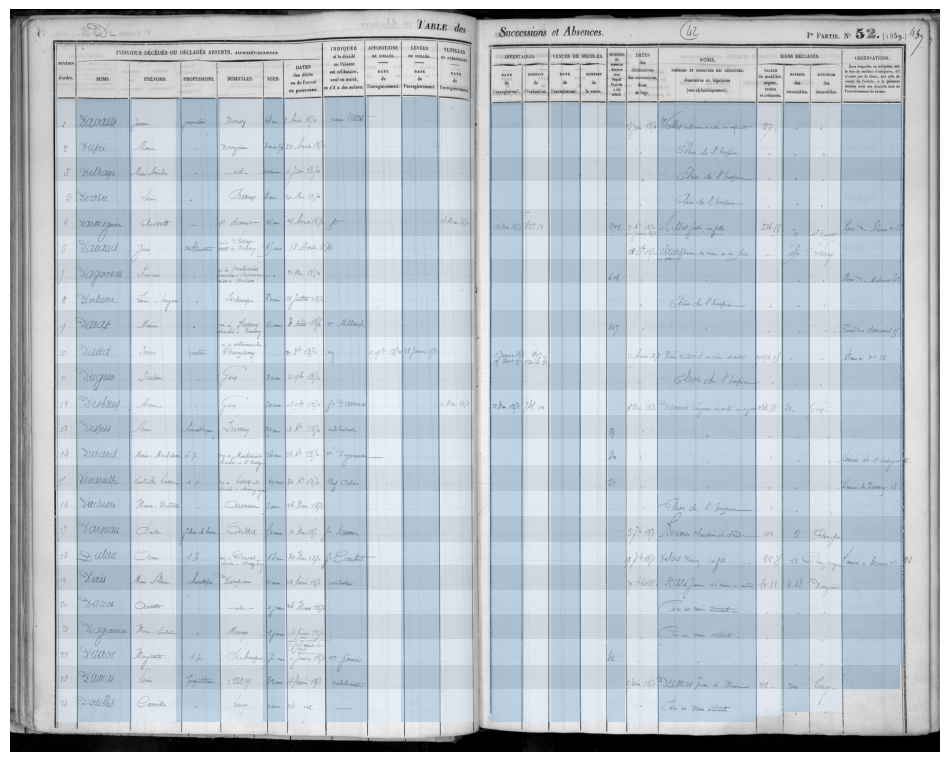

In [ ]:
# @title
import matplotlib.patches as patches

def plot_bounding_boxes(img, grid_cells):
    # Check if the image is loaded
    if img is None:
        print("Image not found or unable to load")
        return

    # Convert color from BGR to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Create a figure and axis for plotting
    fig, ax = plt.subplots(1, figsize=(12, 16))
    ax.imshow(img_rgb)

    # Initialize color settings
    row_colors = [(0.7, 0.7, 0.7, 0.4), (1, 1, 1, 0.4)]  # Grey and white with opacity
    col_colors = [(0.678, 0.847, 1, 0.4), (0, 0.387, 0.681, 0.4)]  # More visible blues with adjusted alpha

    # Draw each bounding box
    for key, (x, y, w, h) in grid_cells.items():
        # Parse the key to determine row and column numbers
        parts = key.split('_')
        col_num = int(parts[0][3:]) - 1  # Convert 'col1' to 0 for indexing
        row_num = int(parts[1][3:]) - 1  # Convert 'row1' to 0 for indexing

        # Determine color based on row and column
        row_color = row_colors[row_num % 2]
        col_color = col_colors[col_num % 2]

        # Mix row and column colors for intersection
        mixed_color = (np.array(row_color) + np.array(col_color)) / 2

        # Create a rectangle patch with the chosen color and add it to the plot
        rect = patches.Rectangle((x, y), w, h, linewidth=2, facecolor=mixed_color, label=key if row_num == 0 and col_num == 0 else "")
        ax.add_patch(rect)

    # Remove axis numbers and ticks
    plt.axis('off')
    # Show the plot
    plt.show()
plot_bounding_boxes(image, grid_cells)


Ok, now we want to take these cell predictions and use them to assign column and row values to our text-line images. If you recall, we saved these in a folder: `/output/text_lines`.

Let's start by getting a list of all the files in that directory. We can do this with the `os.listdir()` function.

**Exercise**

In [ ]:
directory = 'output/text_lines/test_01130f7b81f872ea4141d890b56353c8/'

file_names = os.listdir(directory)
print(f'There are {len(file_names)} files in {directory}')
print(f'The first file is {file_names[0]}')

There are 244 files in output/text_lines/test_01130f7b81f872ea4141d890b56353c8/
The first file is test_01130f7b81f872ea4141d890b56353c8_y523_x2685_w270_h75.png


In [ ]:
directory = 'output/text_lines/test_01130f7b81f872ea4141d890b56353c8'

file_names = ?.?()
print(f'There are {len(file_names)} files in {directory}')
print(f'The first file is {file_names[0]}')

This should find roughly 244 files in the directory. Ok, next, we want to use the filenames from before to find the co-ordinates of each text-line. We can use the `os.path.splitext` to remove the file extension, then we can use the `string.split('')` method, and split on `_` to get the x, y, w, h coordinates.

In [ ]:
file_name = file_names[0]
base_filename = os.path.splitext(file_name)[0]
info = base_filename.split('_')
print(info)

['test', '01130f7b81f872ea4141d890b56353c8', 'y523', 'x2685', 'w270', 'h75']


Ok, great. This should list the file name, the set (test, train, val), and the coordinates. Now we'll assign these to variables, `y, x, w, h`.

In [ ]:
y, x = int(info[2][1:]), int(info[2][1:])
w, h = int(info[4][1:]), int(info[5][1:])

Ok, now I want you to calculate the vertical center of the box, as `y_pos` and a position 10 pixels to the right of the left edge of the box as `x_pos`.

In [ ]:
y_pos = y + h / 2
x_pos = x + 10

That's everything we need. Now we can just loop through the `grid_cells` dictionary, and check if the position of the text_line is within that cell's area. We'll use this information to append the column and row number to the text-line filename.

Here is the full function.

In [ ]:
def assign_cell(directory, grid_cells):
    file_names = os.listdir(directory)
    # Process each file
    for file_name in file_names:
        # Parse the coordinates and dimensions from the filename
        base_filename = os.path.splitext(file_name)[0]
        info = base_filename.split('_')
        y, x = int(info[2][1:]), int(info[3][1:])
        w, h = int(info[4][1:]), int(info[5][1:])

        # Calculate the center y and slightly adjusted x
        y_pos = y + h / 2
        x_pos = x + 10

        matched = False  # Flag to check if a match is found

        # Find the grid cell containing this point
        for key, (cell_x, cell_y, cell_w, cell_h) in grid_cells.items():
            if cell_x <= x_pos < cell_x + cell_w and cell_y <= y_pos < cell_y + cell_h:
                matched = True  # Update flag on match
                # Create new filename with the grid cell key as prefix
                new_file_name = f"{key}_{file_name}"
                old_file_path = os.path.join(directory, file_name)
                new_file_path = os.path.join(directory, new_file_name)

                # Rename the file
                os.rename(old_file_path, new_file_path)
                break


In [ ]:
renamed_files = assign_cell(directory, grid_cells)

If you look back inside '/content/output/text_lines/test_01130f7b81f872ea4141d890b56353c8' you should find these have now all been assigned row and column values.

Let's check how well this worked by plotting each text-line on a grid, according to it's assigned row and column.

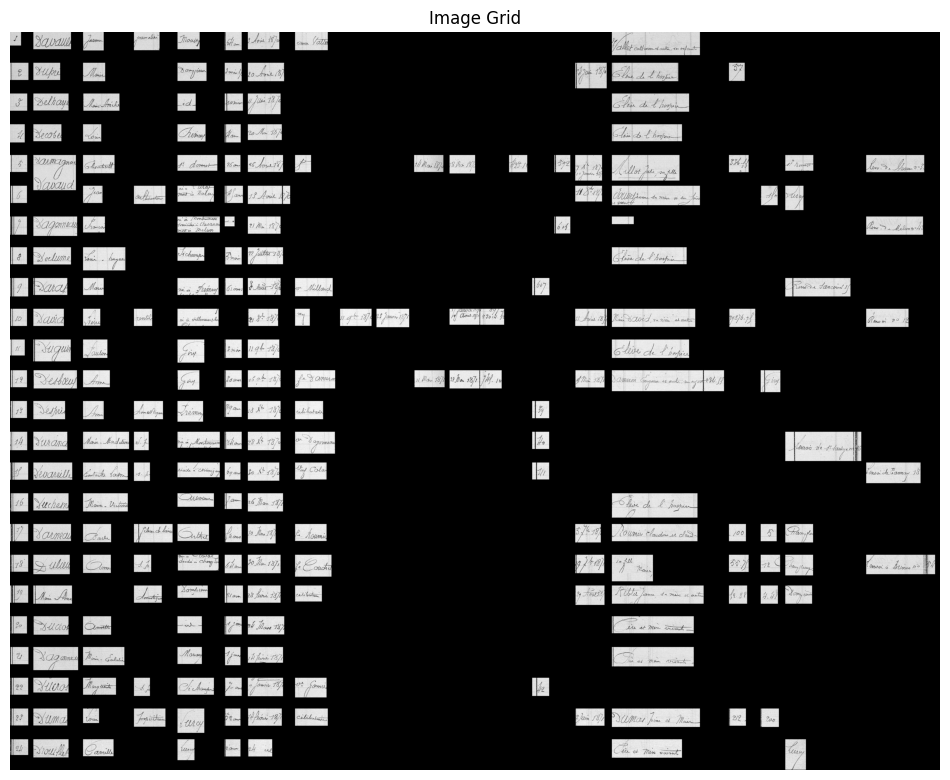

In [ ]:
# @title

def create_large_image_grid_with_matplotlib(directory_path):
    file_names = [f for f in os.listdir(directory_path) if f.endswith('.png')]

    # Store images and their positions
    images = []
    positions = []
    column_widths = {}
    heights = []

    # Parsing filenames and loading images
    for file_name in file_names:
        parts = file_name.split('_')
        col = int(parts[0][3:])  # Extract column number
        row = int(parts[1][3:])  # Extract row number
        img = cv2.imread(os.path.join(directory_path, file_name))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
            images.append(img)
            positions.append((col, row))
            heights.append(img.shape[0])

            # Record the width for each column
            if col in column_widths:
                column_widths[col] = max(column_widths[col], img.shape[1])
            else:
                column_widths[col] = img.shape[1]

    # Calculate median height and prepare vertical buffer
    median_height = np.median(heights) + 55

    # Calculate the starting x-coordinate for each column
    x_offsets = {}
    current_x = 0
    for col in sorted(column_widths):
        x_offsets[col] = current_x
        current_x += column_widths[col] + 20  # Add buffer space between columns

    # Determine canvas size
    canvas_width = current_x
    max_row = max(pos[1] for pos in positions)
    canvas_height = int(max_row * median_height)

    # Create a blank canvas
    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)

    # Place each image on the canvas
    for img, (col, row) in zip(images, positions):
        top_left_x = x_offsets[col]
        top_left_y = int((row - 1) * median_height)
        canvas[top_left_y:top_left_y + img.shape[0], top_left_x:top_left_x + img.shape[1]] = img

    # Use matplotlib to display the final result
    plt.figure(figsize=(12, 18))
    plt.imshow(canvas)
    plt.axis('off')  # Hide axes
    plt.title('Image Grid')
    plt.show()


# Example usage
directory_path = 'output/text_lines/test_01130f7b81f872ea4141d890b56353c8'
create_large_image_grid_with_matplotlib(directory_path)


Looks pretty good! Now onto the last major step, transcription.

**Further Materials**

You might want to explore alternative approaches, in particular you can combine neural networks with the heuristic approaches mentioned at the start of this section, this can yield more powerful results.

Another useful thing to try is training the column and row models yourself. These should already be fully configured, all you need to do is run the training script.

 Here are a few ideas to try out:
- Projection profile segmentation (based on the previous workshop)
- Implement a Hough Line detection method (this video [link text](https://www.youtube.com/watch?v=OchCsSiffeE) gives a brief explainer).
- More complex overlap adjustments? That adjust both boxes, or account for the contents of boxes.
- More sophisticated row/column assigment. Considering flexible parameters that might do this more accurately (keeping in mind that we can have text overflow from a column or run over multiple lines).
- Run training on the column and row models.
- Try loading up your versions of these models.

# HTR

Ok, now we're going to take a look at transcribing these documents. Due to some of the libraries that come by default with Google Colab, we're going to start a new session to make sure we don't have any conflicting dependencies.

If you were doing this locally, you should just create a separate `conda` or `venv` for `doc-ufcn` and `trocr`.

For now I want you to go to the toolbar at the top of the page, click Runtime>Disconnect and Delete Runtime. Then at the top right you should see a Reconnect button. Click this.

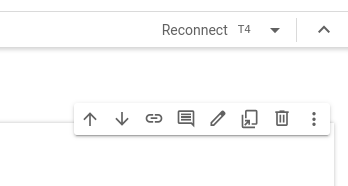

Ok now let's download the libraries we need for transcription, and the data. Unfortunately colab clears your file-space when you delete a session, so we're going to download the output from the line-segmentation.

**Libraries**

In [ ]:
!pip install -q transformers[torch]
!pip install -q accelerate
!pip install -q datasets jiwer
!pip install unidecode

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 3.9 MB/s eta 0:00:00


**Data**

*Warning*: this may take around 5 minutes to download.

In [ ]:
# @title
from tqdm import tqdm
import requests
import os
import shutil
# URL of the file to download
url = "https://dl.dropboxusercontent.com/scl/fi/sxaso6w4dxok4m7qu31il/materials2.zip?rlkey=5e2ct1c5fmlkedbsh70cgdv71&st=iqqxc97k&dl=1"
response = requests.get(url, stream=True)

# Total size in bytes.
total_size = int(response.headers.get('content-length', 0))
block_size = 1024  # 1 Kibibyte

print("Starting download...")
with open("materials2.zip", "wb") as file, tqdm(
        desc="Downloading materials",
        total=total_size,
        unit='iB',
        unit_scale=True,
        unit_divisor=1024) as bar:
    for data in response.iter_content(block_size):
        file.write(data)
        bar.update(len(data))

print("Download completed.")

print("Unzipping files...")
!unzip -o materials2.zip > /dev/null
print("Files unzipped.")

print("Cleaning up downloaded zip file...")
os.remove('materials2.zip')
shutil.rmtree('/content/sample_data')
print("Cleanup completed.")

Starting download...


Download completed.
Unzipping files...
Files unzipped.
Cleaning up downloaded zip file...
Cleanup completed.


Finally, let's import the different libraries we'll need. We can go through these in a minute.

In [ ]:
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments, TrOCRProcessor, VisionEncoderDecoderModel, default_data_collator, AutoTokenizer
import pandas as pd
import torch
from torch.utils.data import Dataset
from PIL import Image
from datasets import load_metric


For Handwritten Text Recognition (HTR) we are going to use a model called `TrOCR`.

## Training a Model

First, let's take a look at the data we have available. Navigate to the /data_trocr/training folder in the file navigator. Here you will find a folder called `images` and a file called `text.csv`. Double-click the `.csv` to open it.

You can see here that we have a list of text-line sub_image names, as well as a transcription of each line of text.

*Note*: These text-lines do not have the row/column name because we trained the models in a different order, however ideally they would have these assigned.

**Exercise**

Let's load up this dataframe. Remember, you can load a dataframe with `pd.read_csv()`.



In [ ]:
df = pd.read_csv('data_trocr/training/text.csv')
df.head()

,filename,text
0,test_0941c6a1ecca168beb69062459bd67b9_x235_y40...,Lechauve
1,test_0941c6a1ecca168beb69062459bd67b9_x475_y41...,François
2,test_0941c6a1ecca168beb69062459bd67b9_x984_y43...,65 ans
3,test_0941c6a1ecca168beb69062459bd67b9_x1210_y4...,époux d'Etiennette
4,test_0941c6a1ecca168beb69062459bd67b9_x2335_y4...,86


Ok, now we're going to assign these files to train, validate, and test sets

*Note*: Technically, as evidenced by their filenames they have already been assigned, however we are going to reassign them so you can see how.

**Exercise**

To create new datasets we can call the `df.sample()` function which takes a parameter `frac=` which randomly samples a fraction of rows from a dataframe.

Let's create a training dataset covering 80% of the original data. Then we'll create a temporary dataframe by using `df.drop(train_df,index)` to drop all the rows which are in the `train_df`, we can then split that dataframe in half, assign those to `val_df`, and then drop those rows from `temp_df` to create `test_df`.

In [ ]:
#Reducing size of training data so we can quickly try it out
df = df.sample(frac=0.1, random_state=0)

train_df = df.sample(frac=0.8, random_state=0)
temp_df = df.drop(train_df.index)
val_df = temp_df.sample(frac=0.5, random_state=0)
test_df = temp_df.drop(val_df.index)

print(f'Train Dataset: {len(train_df)} rows\nVal Dataset: {len(val_df)} rows\nTest Dataset: {len(test_df)} rows')

Train Dataset: 800 rows
Val Dataset: 100 rows
Test Dataset: 100 rows


We can then reset the indices of each of these dataframe, this is going to allow us to correctly match these dataframe items to the images.

In [ ]:
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

Ok, now that we have got the data loaded into dataframe, we are going to pass it through a data loader. The aim of the data loader is to pre-process the data, and get it ready for the deep learning model.

Let's try and break this down step by step.

1. So first we are going to define a class. We can think of a class as a blueprint for creating new objects, that encapsulates both data (i.e. variables) and functions. We can define a set of attributes and methods that all objects in that class will possess.

We're going to define a class `tsaLoader`.

```python3
class tsaLoader(Dataset):
    def __init__(self, input_dir, df, feature_extractor, tokenizer, max_target_length=128):
```

You'll see that this class has a method `__init__`. This is a special function (or method) that is called automatically when we create an instance of our `tsaLoader` class.

2. Our class is initialised with a number of different parameters.
- `input_dir`: Where the images are stored.
- `df`: a dataframe containing filenames and the corresponding text.
- `feature_extractor`: a feature extractor provided by the model, which will pre-process the images into the suitable format.
- `tokenizer`: a tokenizer that will be used to segment text into special sub-tokens, and encode the text data.
- `max_target_length`: a maximum length text to generate.

```python3
    def __init__(self, input_dir, df, feature_extractor, tokenizer, max_target_length=128):
        self.root_dir = input_dir + 'images/'
        self.df = df
        self.feature_extractor = feature_extractor
        self.tokenizer = tokenizer
        self.max_target_length = max_target_length
```

3. When we call the `__getitem__` method of the class, this will return an encoding dictionary that contains the preprocessed data for a single sample of data. This contains the `pixel_values` of the processed image, the tokenized and encoded `labels` and an `attention_mask` indicating valid tokens.

```python3
    def __getitem__(self, idx):
        filename = self.df.iloc[idx]['filename']
        text = self.df.iloc[idx]['text']
        image = Image.open(os.path.join(self.root_dir, filename)).convert("RGB")
        
        # Use feature_extractor for images
        pixel_values = self.feature_extractor(images=image, return_tensors="pt").pixel_values

        text = str(text) if text is not None else ""
        
        # Use tokenizer for text
        labels = self.tokenizer(text, padding="max_length", max_length=self.max_target_length).input_ids
        labels = [label if label != self.tokenizer.pad_token_id else -100 for label in labels]

        attention_mask = [1 if label != self.tokenizer.pad_token_id else 0 for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(),
                    "labels": torch.tensor(labels),
                    "attention_mask": torch.tensor(attention_mask)
                   }
        return encoding
```

4. The labels are the ground truth values we want to predict. The attention mask is a binary mask of tokens, which indicates which are valid for attention (see explanation of deep learning at the start). All valid tokens are assigned a 1 and padding tokens (to ensure sequences of the same length) are assigned a 0.

Run the code below to create this class.

In [ ]:
class tsaLoader(Dataset):
    def __init__(self, input_dir, df, feature_extractor, tokenizer, max_target_length=128):
        self.root_dir = input_dir + 'images/'
        self.df = df
        self.feature_extractor = feature_extractor
        self.tokenizer = tokenizer
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        filename = self.df.iloc[idx]['filename']
        text = self.df.iloc[idx]['text']
        image = Image.open(os.path.join(self.root_dir, filename)).convert("RGB")

        # Use feature_extractor for images
        pixel_values = self.feature_extractor(images=image, return_tensors="pt").pixel_values

        text = str(text) if text is not None else ""

        # Use tokenizer for text
        labels = self.tokenizer(text, padding="max_length", max_length=self.max_target_length).input_ids
        labels = [label if label != self.tokenizer.pad_token_id else -100 for label in labels]

        attention_mask = [1 if label != self.tokenizer.pad_token_id else 0 for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(),
                    "labels": torch.tensor(labels),
                    "attention_mask": torch.tensor(attention_mask)
                   }
        return encoding

In [ ]:
train_dataset = tsaLoader(input_dir='data_trocr/training/',
                           df=train_df,
                           feature_extractor=processor,
                           tokenizer=tokenizer)

eval_dataset = tsaLoader(input_dir='data_trocr/training/',
                           df=val_df,
                           feature_extractor=processor,
                           tokenizer=tokenizer)

Now let's load up our base model, processor and tokenizer (you can find this model on HuggingFace, which is where we are downloading it from).

These are all functions from the transformers library, that let us load-up pre-existing models (which we use for inference), processors (which get the data ready for the model), and tokenizers (which assign unique vectors to sub-words which act as the inputs to our model).

In [ ]:
model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-base-handwritten")

processor = TrOCRProcessor.from_pretrained("microsoft/trocr-base-handwritten")
tokenizer = AutoTokenizer.from_pretrained("microsoft/trocr-base-handwritten")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-base-handwritten and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


We then need to configure our model.
Let's go through these different settings:
- first three just make sure that special tokens we are using: for the start of the text, padding, and the end of the text are the same in our model and our processor.
-`max_length`: sets the maximum length of the generated sequence (in tokens). In this case it is set to 128 (the max length of any transcription we find.
-`num_beams`: Means that the decoder will explore multiple possible output sequences at once, and keep a number of different candidates at each step.
-`early_stopping`: allows beam search to stop once `num_beams` sequences have been finished.
-`length_penalty`: penalises or favours longer sequences (>1 favours longer sequences).
-`no_repeat_ngram_size=3`: penalises repeated sequences of the same tokens.

In [ ]:
# set special tokens used for creating the decoder_input_ids from the labels
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
model.config.eos_token_id = processor.tokenizer.sep_token_id

# set beam search parameters
model.config.max_length = 128
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4

Ok, now that the model is configured we need to configure our training object.

When training TrOCR we use a sequence-to-sequence architecture that takes both image patches and tokens (sub-words), alongside a positional embedding, and uses these to output a sequence of text.

The `Seq2SeqTrainer` is a tool that helps simplify this process, handling the training, evaluation and prediction.

Let's take a look at the code below:
- `batch_size`: determines how many samples the model processes at once. Increasing this will speed up training, but will use more computational power, and may result in overfitting.
- We have a few different parameters which concern how often we want to evaluate or save our model, and where.
- `learning_rate`: determines the size of the steps the optimiser takes during gradient descent (i.e. when updating the model weights). A higher value can lead to faster convergence, but may reduce the accuracy of the model.
- `num_train_epochs`: determines how many times the model will go through the entire training data set.

*Note*: Here we are only using a fraction of the training data (800 lines out of 40,000 for the full model), and for a fraction of the time (1 epoch instead of 30). We're going to quick see how to train a model, then load up the full model (which took around 8 hours to train).

In [ ]:
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy="steps",
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    fp16=True,
    output_dir="output/htr",
    logging_steps=2,
    save_steps=50,
    eval_steps=50,
    learning_rate=5e-5,
    num_train_epochs=1
)

Ok, now that we've got the trainer set up, we're going to set up our evaluation.

We're going to provide this function to the trainer as an evaluation function. The function takes our prediction object `pred` which contains the predicted text and ground truth labels, and computer a Character Error Rate. It first extracts the predicted text and labels from the `pred` object and decodes them from token IDs back into `text` using `processor.batch_decode`.

The CER is then calculated using the `cer_metric.compute` function, which measures the edit distance between the predicted text and ground truth text, normalised by the number of characters in the ground truth text.

In [ ]:

cer_metric = load_metric("cer")

def compute_metrics(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)

    return {"cer": cer}


/usr/local/lib/python3.10/dist-packages/datasets/load.py:759: FutureWarning: The repository for cer contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.0/metrics/cer/cer.py
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this metric from the next major release of `datasets`.
  warnings.warn(


Finally we're going to create our trainer object, which will take our model, our training arguments, our evaluation, and our data, and set them up for training.

In [ ]:
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.feature_extractor,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    data_collator=default_data_collator,
)


/usr/local/lib/python3.10/dist-packages/transformers/models/trocr/processing_trocr.py:136: FutureWarning: `feature_extractor` is deprecated and will be removed in v5. Use `image_processor` instead.
  warnings.warn(


Now all that's left to do is train the model.

In [ ]:
trainer.train()

As you'll see the CER starts fairly high, at around 0.6, though it should decline in the second evaluation. The final CER currently achieved by this model on the corpus is 0.135 (though this measure includes differences in case, i.e. C rather than c).

# End-to-End

Ok, now we can take everything we've done and begin using this to predict entire pages (and evaluate them).

If you look in /content/data_trocr you'll see that I have added two folders `ground_truth` and `text_lines`. This contains the ground-truth transcription for a single page, as well as the `text_lines` which we extracted using our text-line, row, and column models earlier.

Let's take a look at the ground_truth file.

In [ ]:
df_gt = pd.read_csv('data_trocr/ground_truth/test_b9780fe52f1619b0273ea579528f7209.csv')
df_gt.head()

,NUMÉROS d'ordre.,NOMS.,PRÉNOMS.,PROFESSIONS.,DOMICILES.,ÂGES.,DATE des décès ou de l'envoi en possession.,"INDIQUER si le décédé ou l'absent est célibataire, veuf ou marié, et s'il a des enfants.",DATE de l'enregistrement.,DATE de l'enregistrement..1,...,MONTANT de l'évaluation.,DATE de l'enregistrement..4,MONTANT de la vente.,NUMÉRO du sommier douteux sous lequel l'article a été relevé.,DATES des déclarations des successions. dons ou legs.,"NOMS, PRÉNOMS ET DEMEURES DES HÉRITIERS, donataires ou légataires (non alphabétiquement).","VALEUR du mobilier, argent, rentes et créances.",REVENUS des immeubles.,SITUATION des immeubles.,"OBSERVATIONS, Dans lesquelles ou indiquera, soit la date du certificat d'indigence, s'il n'existe pas de biens; soit celle du renvoi de l'article, si la personne décedée avait son domicile hors de l'arrondissement du bureau."
0,294,Courault,Antonie,s. pr.,Larochemillay,23 jours,26 Xbre 1866,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,Néant,"Porra*<nl>Jean et Marie Charlette, ses pere<nl...",NaN,NaN,NaN,NaN
1,395,Coulon,Francois,id,Flety,5 ans,13 7e 1866,enfant,NaN,NaN,...,NaN,NaN,NaN,NaN,néant,père et mère Vivants,NaN,NaN,NaN,NaN
2,396,Cabotin,Lydie,id,né à Paris decedé<nl>a Lurcy,21 mois,3 8e 1866,id,NaN,NaN,...,NaN,NaN,NaN,NaN,néant,Eleve de l'hospice de Paris,NaN,NaN,NaN,Rvé. à Paris No 96
3,397,Carzon,Louis,cultie Vateur,à Mangy Ene de<nl>Lurcy,17 ans,15 Octobre 1866,celibataire,NaN,NaN,...,NaN,NaN,NaN,NaN,néant,Lazare et Mehric Louise ses père et mère<nl>vi...,NaN,NaN,NaN,NaN
4,398,Chandelier,Lazare,s. pr.,Lurcy,11 mois,10 9bre 1866,enfant,NaN,NaN,...,NaN,NaN,NaN,NaN,néant,père et mère Vivants,NaN,NaN,NaN,NaN


As with before we want to make sure our device is set to `cuda`.

In [ ]:
if torch.cuda.is_available():
  device = torch.device("cuda:0")
else:
  device= torch.device("cpu")

print(f"Using: {device}")

In [ ]:
if torch.cuda.is_available():
  device = torch.device("cuda:0")
else:
  device= torch.device("cpu")
print(f"Using: {device}")

Using: cuda:0


Ok, now we want to load up our HTR model (which I have saved in /content/models/)trocr and then run inference on our text-lines.

Let's load this the same way we did before (but with the `local_files_only` flag set to True.

In [ ]:
processor = TrOCRProcessor.from_pretrained("models/trocr/i6eq5plg/checkpoint-224228/", local_files_only=True)
tokenizer =  AutoTokenizer.from_pretrained("models/trocr/i6eq5plg/checkpoint-224228/", local_files_only=True)
model = VisionEncoderDecoderModel.from_pretrained("models/trocr/i6eq5plg/checkpoint-224228/", local_files_only=True)
model.to(device)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


VisionEncoderDecoderModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-23): 24 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=1024, out_features=1024, bias=False)
              (key): Linear(in_features=1024, out_features=1024, bias=False)
              (value): Linear(in_features=1024, out_features=1024, bias=False)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=1024, out_features=1024, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Line

Now we want to loop through all the sub_images associated with our page, generate a transcript and assign those sub_images a row and column number. First let's create a function that takes our filenames, which if you remember look like `'col15_row17_y2353_x2140_w82_h87.png'`.

In [ ]:
def filename_parse(filename):
    parts = filename.split('_')
    column = parts[0][3:]  # Remove 'col' and take the number
    row = parts[1][3:]     # Remove 'row' and take the number
    y = parts[2][1:]       # Remove 'y' and take the number
    x = parts[3][1:]       # Remove 'x' and take the number
    w = parts[4][1:]       # Remove 'w' and take the number
    h = parts[5].split('.')[0][1:]  # Remove 'h', take the number before '.png'
    return column, row, y, x, w, h

Now let's write a function that performs HTR using our model on specific text-lines, and assigns the appropriate meta information. We're going to cycle through these sub-images and add each one to a dataframe with it's row and column number.

*Note:* You could speed this up substantially (a factor of 8-16x) using batch inference, similar to what we do in the training process.

In [ ]:
textline_path = 'data_trocr/text_lines/test_b9780fe52f1619b0273ea579528f7209'
image_name = 'test_b9780fe52f1619b0273ea579528f7209.jpg'
sub_images = os.listdir(textline_path)
sub_images = sub_images

df_pred = pd.DataFrame(columns=['filename', 'sub_file', 'row', 'column', 'x', 'y', 'w', 'h', 'transcription'])


for sub_image in sub_images:
  column, row, y, x, w, h = filename_parse(sub_image)

  #Load the Image
  image = Image.open(f'{textline_path}/{sub_image}').convert("RGB")
  #Get inputs
  pixel_values = processor(image, return_tensors="pt").pixel_values.to(device)
  #Generate tokens
  generated_ids = model.generate(pixel_values)
  #Convert to text
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

  temp_df = pd.DataFrame({
    'filename': [image_name],
    'sub_file': [sub_image],  # Assuming filename is used as sub_file too
    'row': [row],
    'column': [column],
    'y': [y],
    'x': [x],
    'w': [w],
    'h': [h],
    'transcription': [generated_text]
  })

  df_pred = pd.concat([df_pred, temp_df], ignore_index=True)

df_pred.head()

,filename,sub_file,row,column,x,y,w,h,transcription
0,test_b9780fe52f1619b0273ea579528f7209.jpg,col6_row10_y1584_x999_w87_h92.png,10,6,999,1584,87,92,62 ans
1,test_b9780fe52f1619b0273ea579528f7209.jpg,col5_row16_y2339_x820_w176_h49.png,16,5,820,2339,176,49,ne a Angoleme
2,test_b9780fe52f1619b0273ea579528f7209.jpg,col4_row3_y824_x669_w148_h102.png,3,4,669,824,148,102,Cult de dateur
3,test_b9780fe52f1619b0273ea579528f7209.jpg,col16_row16_y2258_x2258_w82_h87.png,16,16,2258,2258,82,87,nan
4,test_b9780fe52f1619b0273ea579528f7209.jpg,col5_row9_y1480_x810_w196_h87.png,9,5,810,1480,196,87,"ne a Flety, decede"


Ok, so now we need to try and map these column numbers onto variables. This corpus actually contains several different table types, so the column number maps onto different columns depending on the exact file.

Let's load up the `page_classification.csv` in the `data_trocr` folder.

In [ ]:
df_pages = pd.read_csv('data_trocr/page_classification.csv')
df_pages.head()

,File,Relative Path,Type
0,test_0cc4bc3db1bbde0e00e4749ae7092ed8.jpg,test/Nièvre/Saint-Saulge/1859-1869/test_0cc4bc...,2Ab
1,test_553a6d3d4940df294cbc93aa930db678.jpg,test/Nièvre/Saint-Saulge/1859-1869/test_553a6d...,2Ab
2,test_d7fb5a8530c43858f9a1d56c94e4b9b8.jpg,test/Nièvre/Saint-Saulge/1859-1869/test_d7fb5a...,2Ab
3,test_041b618ed8f96b40e454e0f58d0d4eb9.jpg,test/Nièvre/Saint-Saulge/1859-1869/test_041b61...,2Ab
4,test_0d2e36c84cc2f63c82e3e5c198760af8.jpg,test/Nièvre/Saint-Saulge/1859-1869/test_0d2e36...,2Ab


Here we can see each file name has been assigned a specific table Type. We then have another csv, `table_guide.csv` that maps each of these Type values onto a specific set of columns, let's load that up and take a look.

In [ ]:
df_tables = pd.read_csv('data_trocr/table_guide.csv')
df_tables.head()

,table_type,col_num,col_name,data_type
0,1A,1,Article Number,int
1,1A,2,Surname,str
2,1A,3,First Name,str
3,1A,4,Profession,str
4,1A,5,Residences,str


For now we'll just create a dataframe that stores the type of tables found in the example image we segmented.

In [ ]:
df_pages[df_pages['File']==image_name]

,File,Relative Path,Type
2144,test_b9780fe52f1619b0273ea579528f7209.jpg,test/Nièvre/Luzy/1860-1868/test_b9780fe52f1619...,2Ab


So our table type is '2Ab'. We can find the column names for this type in the `df_tables` dataframe.

In [ ]:
 matched_rows = df_tables[df_tables['table_type'] == '2Ab']
 matched_rows

,table_type,col_num,col_name,data_type
65,2Ab,1,Article Number,int
66,2Ab,2,Surname,str
67,2Ab,3,First Name,str
68,2Ab,4,Profession,str
69,2Ab,5,Residences,str
70,2Ab,6,Age,str
71,2Ab,7,Date of Death (or leaving of department),date
72,2Ab,8,Information on marital status and children (ma...,str
73,2Ab,9,Date of apposition of seals,date
74,2Ab,10,Date of unsealing,date


Now we're going to take each of those `col_num` and `col_name` values and `zip` them together into a dictionary, which we can use as the column names for our dataframe.

In [ ]:
col_ref = dict(zip(matched_rows['col_num'], matched_rows['col_name']))
col_ref

{1: 'Article Number',
 2: 'Surname',
 3: 'First Name',
 4: 'Profession',
 5: 'Residences',
 6: 'Age',
 7: 'Date of Death (or leaving of department)',
 8: 'Information on marital status and children (married, widowed, etc.)',
 9: 'Date of apposition of seals',
 10: 'Date of unsealing',
 11: 'Guardianships and trusteeships',
 12: 'Inventory: Date of Registration',
 13: 'Inventory: Valuation amount',
 14: 'Furniture sale: Date of registration',
 15: 'Furniture sale: Valuation amount',
 16: 'Number of the dubious base under which the item was found',
 17: 'Dates for declarations of inheritance, gifts, or legacies',
 18: 'Names, and residences of each of the heirs, donees, legatees, and others',
 19: 'Declared assets: Value of furniture, money, annuities and debts',
 20: 'Declared assets: Income from buildings',
 21: 'Declared assets: Situation of buildings',
 22: 'Observations'}

We're going to create a new column `col_name` and uses the `map()` method to map the integer values in `column` column to their corresponding column names in the dictionary.

In [ ]:
df_pred['col_name'] = df_pred['column'].astype(int).map(col_ref)
df_pred

,filename,sub_file,row,column,x,y,w,h,transcription,col_name
0,test_b9780fe52f1619b0273ea579528f7209.jpg,col6_row10_y1584_x999_w87_h92.png,10,6,999,1584,87,92,62 ans,Age
1,test_b9780fe52f1619b0273ea579528f7209.jpg,col5_row16_y2339_x820_w176_h49.png,16,5,820,2339,176,49,ne a Angoleme,Residences
2,test_b9780fe52f1619b0273ea579528f7209.jpg,col4_row3_y824_x669_w148_h102.png,3,4,669,824,148,102,Cult de dateur,Profession
3,test_b9780fe52f1619b0273ea579528f7209.jpg,col16_row16_y2258_x2258_w82_h87.png,16,16,2258,2258,82,87,nan,Number of the dubious base under which the ite...
4,test_b9780fe52f1619b0273ea579528f7209.jpg,col5_row9_y1480_x810_w196_h87.png,9,5,810,1480,196,87,"ne a Flety, decede",Residences
...,...,...,...,...,...,...,...,...,...,...
213,test_b9780fe52f1619b0273ea579528f7209.jpg,col18_row0_y485_x2442_w412_h96.png,0,18,2442,485,412,96,Jean et Marie-Charlette Pozaudine <nl>ses pere,"Names, and residences of each of the heirs, do..."
214,test_b9780fe52f1619b0273ea579528f7209.jpg,col8_row20_y2773_x1225_w115_h49.png,20,8,1225,2773,115,49,Renoit,Information on marital status and children (ma...
215,test_b9780fe52f1619b0273ea579528f7209.jpg,col7_row7_y1258_x1084_w143_h87.png,7,7,1084,1258,143,87,1er Cetobre 66,Date of Death (or leaving of department)
216,test_b9780fe52f1619b0273ea579528f7209.jpg,col3_row6_y1164_x494_w134_h92.png,6,3,494,1164,134,92,Georges,First Name


Let's remove the columns we don't need for now.

In [ ]:
df_pred_final = df_pred[['filename', 'row', 'col_name', 'transcription']]
df_pred_final.head()

,filename,row,col_name,transcription
0,test_b9780fe52f1619b0273ea579528f7209.jpg,10,Age,62 ans
1,test_b9780fe52f1619b0273ea579528f7209.jpg,16,Residences,ne a Angoleme
2,test_b9780fe52f1619b0273ea579528f7209.jpg,3,Profession,Cult de dateur
3,test_b9780fe52f1619b0273ea579528f7209.jpg,16,Number of the dubious base under which the ite...,nan
4,test_b9780fe52f1619b0273ea579528f7209.jpg,9,Residences,"ne a Flety, decede"


Let's now take our `df_gt`, rename the columns to this homogenised format and reshape it to this format using the `melt` method.


In [ ]:
col_names = [col_ref.get(i+1, df_gt.columns[i]) for i in range(df_gt.shape[1])]
df_gt.columns = col_names
df_gt_long = pd.melt(df_gt.reset_index(), id_vars=['index'], var_name='col_name', value_name='ground_truth')
df_gt_long.rename(columns={'index': 'row'}, inplace=True)
df_gt_long['filename'] = image_name
df_gt_long.head()

,row,col_name,ground_truth,filename
0,0,Article Number,294,test_b9780fe52f1619b0273ea579528f7209.jpg
1,1,Article Number,395,test_b9780fe52f1619b0273ea579528f7209.jpg
2,2,Article Number,396,test_b9780fe52f1619b0273ea579528f7209.jpg
3,3,Article Number,397,test_b9780fe52f1619b0273ea579528f7209.jpg
4,4,Article Number,398,test_b9780fe52f1619b0273ea579528f7209.jpg


We're now going to merge our ground-truth and prediction dataframes, to add the transcription column to the matching columns and rows of the ground truth,

In [ ]:
df_pred_final['row'] = df_pred_final['row'].astype(int)
df_combined = pd.merge(df_gt_long, df_pred_final, on=['row', 'col_name', 'filename'], how='left')
df_combined.head()

<ipython-input-80-36a1619057cb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pred_final['row'] = df_pred_final['row'].astype(int)


,row,col_name,ground_truth,filename,transcription
0,0,Article Number,294,test_b9780fe52f1619b0273ea579528f7209.jpg,294
1,1,Article Number,395,test_b9780fe52f1619b0273ea579528f7209.jpg,395
2,2,Article Number,396,test_b9780fe52f1619b0273ea579528f7209.jpg,396
3,3,Article Number,397,test_b9780fe52f1619b0273ea579528f7209.jpg,397
4,4,Article Number,398,test_b9780fe52f1619b0273ea579528f7209.jpg,298


As our model is not trained on accented characters, we're just going to remove these for now.

In [ ]:
from unidecode import unidecode
df_combined['ground_truth'] = df_combined['ground_truth'].astype(str)
df_combined['transcription'] = df_combined['transcription'].astype(str)

df_combined['ground_truth'] = df_combined['ground_truth'].apply(unidecode)


Finally, we'll go row by row and calculate the character error rate.

In [ ]:
import jiwer

def calculate_cer(row):

    # Compute Character Error Rate
    return jiwer.cer(row['ground_truth'], row['transcription'])

df_combined['CER'] = df_combined.apply(calculate_cer, axis=1)
df_combined.head()

,row,col_name,ground_truth,filename,transcription,CER
0,0,Article Number,294,test_b9780fe52f1619b0273ea579528f7209.jpg,294,0.000000
1,1,Article Number,395,test_b9780fe52f1619b0273ea579528f7209.jpg,395,0.000000
2,2,Article Number,396,test_b9780fe52f1619b0273ea579528f7209.jpg,396,0.000000
3,3,Article Number,397,test_b9780fe52f1619b0273ea579528f7209.jpg,397,0.000000
4,4,Article Number,398,test_b9780fe52f1619b0273ea579528f7209.jpg,298,0.333333


Let's create some summary statistics.

In [ ]:
eval_summary = df_combined.groupby('col_name')['CER'].agg(
    Mean='mean',
    Median='median',
    Max='max',
    Min='min',
    Std_Dev='std'
)

Let's take a look (below). As you'll see the median character error rate for most variables is very low. However, for a few variables some very high values throw the mean by quite a bit. Let's take a look.

In [ ]:
eval_summary

,Mean,Median,Max,Min,Std_Dev
col_name,,,,,
Age,0.243764,0.000000,2.142857,0.0,0.570232
Article Number,0.206349,0.000000,2.666667,0.0,0.609883
Date of Death (or leaving of department),0.216011,0.100000,1.000000,0.0,0.311963
Date of apposition of seals,0.000000,0.000000,0.000000,0.0,0.000000
Date of unsealing,0.000000,0.000000,0.000000,0.0,0.000000
"Dates for declarations of inheritance, gifts, or legacies",0.760714,0.000000,11.000000,0.0,2.517819
Declared assets: Income from buildings,0.000000,0.000000,0.000000,0.0,0.000000
Declared assets: Situation of buildings,0.000000,0.000000,0.000000,0.0,0.000000
"Declared assets: Value of furniture, money, annuities and debts",0.023810,0.000000,0.500000,0.0,0.109109


In [ ]:
df_combined[df_combined['col_name']=='Profession']

,row,col_name,ground_truth,filename,transcription,CER
63,0,Profession,s. pr.,test_b9780fe52f1619b0273ea579528f7209.jpg,s.p.,0.333333
64,1,Profession,id,test_b9780fe52f1619b0273ea579528f7209.jpg,id,0.000000
65,2,Profession,id,test_b9780fe52f1619b0273ea579528f7209.jpg,id,0.000000
66,3,Profession,cultie Vateur,test_b9780fe52f1619b0273ea579528f7209.jpg,Cult de dateur,0.307692
67,4,Profession,s. pr.,test_b9780fe52f1619b0273ea579528f7209.jpg,s. p.,0.166667
68,5,Profession,Terrassier,test_b9780fe52f1619b0273ea579528f7209.jpg,Terrassier,0.000000
69,6,Profession,sans prof,test_b9780fe52f1619b0273ea579528f7209.jpg,sans prof,0.000000
70,7,Profession,enfant,test_b9780fe52f1619b0273ea579528f7209.jpg,enfant,0.000000
71,8,Profession,journalier,test_b9780fe52f1619b0273ea579528f7209.jpg,journalier,0.000000
72,9,Profession,sans prof.,test_b9780fe52f1619b0273ea579528f7209.jpg,sans prof.,0.000000


As you'll see the transcription is pretty good, the main issue is that issues in line segmentation can throw the CER by quite a bit. Fortunately, we can improve this through text processing.

If we look at columns with clearer, larger writing, we'll see that the transcription is of a very high quality here.

In [ ]:
df_combined[df_combined['col_name']=='Surname']

,row,col_name,ground_truth,filename,transcription,CER
21,0,Surname,Courault,test_b9780fe52f1619b0273ea579528f7209.jpg,Courault,0.000000
22,1,Surname,Coulon,test_b9780fe52f1619b0273ea579528f7209.jpg,Coulon,0.000000
23,2,Surname,Cabotin,test_b9780fe52f1619b0273ea579528f7209.jpg,Cabotin,0.000000
24,3,Surname,Carzon,test_b9780fe52f1619b0273ea579528f7209.jpg,Carzon,0.000000
25,4,Surname,Chandelier,test_b9780fe52f1619b0273ea579528f7209.jpg,Chandelier,0.000000
26,5,Surname,Chabot,test_b9780fe52f1619b0273ea579528f7209.jpg,Chabon,0.166667
27,6,Surname,Carzon,test_b9780fe52f1619b0273ea579528f7209.jpg,Carzon,0.000000
28,7,Surname,Clement,test_b9780fe52f1619b0273ea579528f7209.jpg,Clement,0.000000
29,8,Surname,Clement,test_b9780fe52f1619b0273ea579528f7209.jpg,Clement,0.000000
30,9,Surname,Claire,test_b9780fe52f1619b0273ea579528f7209.jpg,Claire,0.000000


**Further Materials**

That's it for the main content of this workshop. However, there are lots of directions to take this if you are interested.

You might want to try thinking about what types of text cleaning and processing you want to use.

Here are a few ideas to try out:
- Separating text with the newline <nl> character into the correct line.
- Merging multiple text-boxes in the same cell correctly.
- Retraining the model with accents (though you'd have to add new tokens to the tokenizer).
- Add a batch loader for inference, so you can infer multiple images at once (this is similar to how we run it in the trainer).
- Building your own project. A simpler example of this type of project can be found in the IAM dataset, which only requires line segmentation and HTR. Can you correctly get these models working on that dataset? (You can download the data [here](https://fki.tic.heia-fr.ch/databases/iam-handwriting-database), see the previous workshop for information on how to setup Python locally, you will need to install some additional libraries, like `torch`.)

You can download the data and models for this workshop [here](https://www.dropbox.com/scl/fi/tv4tw0oek125whp5u84dr/materials1.zip?rlkey=j840cqfqjzkt05qnqi1cmmudi&st=y9lkhsao&dl=0) and [here](https://www.dropbox.com/scl/fi/0qk267x2o06vv5nc00cpl/materials2.zip?rlkey=dwyh45cv0zsmawfkee8ctkikg&st=9ac9kz52&dl=0) if you wish to experiment more on your own device.

You will need acces to a GPU to run these models at a reasonable speed, this means either having hardware with a suitable CUDA GPU, or using either AWS, Google Cloud or your university's High Performance Computing facilities.

I mentioned at the beginning that I use a custom-script to convert from COCO format to the custom format used by doc-ufcn. You can find that script [here](https://colab.research.google.com/drive/1UTh13H3C7dyNQeI2B-sgF6BYF8apjq00?usp=sharing). You need to run `process_main` and you can choose whether you want bounding boxes or full polygons, as well as whether you want to force some pixel space between different boxes to prevent overlap.

# Next Steps

Well done for getting this far! So what next?

If you want to pursue automated transcription further you should focus on three things: (i) getting a solid basic grasp of Python, (ii) getting a basic grasp of deep learning methods, (iii) practicing these skills on your own projects or example datasets like IAM or READ.

I've detailed some resources below:

I'll briefly try and sketch out a Learning Path if you want to begin to engage seriously with these methods. Below are a number of useful resources. I have rated them each on a Practical -> Theoretical scale from (\*) to (*****). I recommend completing these all, in order. Except for Nield and Torralba all are freely accessible.

**1. Python**
* [CodeAcademy](https://www.codecademy.com/learn/paths/learn-python-for-data-science) (*): The most important first step is a basic understanding of Python. I recommend starting with this CodeAcademy course. It will teach you the basics of Python and the main data science libraries: `pandas`1 (for dataframes), and `numpy` (for maths). There is a free trial, and this shouldn't take more than a couple of weeks to complete.

**2. Maths**
* Nield, *Essential Math for Data Science* (\**): Deep Learning requires a basic grounding in calculus, statistics, and linear algebra. If you are already familiar with econometrics, you can skip this step.

**3. Deep Learning**

There are innumerable resources teaching machine and deep learning. I recommend trying to get both a theoretical and more practical understanding.
* James et al, [Introduction to Statistical Learning with Applications in Python](https://www.statlearning.com/) (\****): A beginner friendly but still mathematical introduction to machine learning methods.
* Zhang et al., [Dive into Deep Learning](https://d2l.ai/index.html) (\***): Interactive book attempting to present deep learning topics in an approachable manner, providing context, code, and maths.
* Noble [Neural Networks for Scratch](https://rb.gy/aolnqw) (\****): An approachable set of workshops where you'll learn how to build a very simple neural network using nothing more complex than multiplication. This series is still ongoing.

**4. Computer Vision**

If you want to expand on this by learning more about deep learning for computer vision, I'd recommend:
- Torralba et al, [Foundations of Computer Vision](https://mitpress.mit.edu/9780262048972/foundations-of-computer-vision/) (\**):

**Journals**

If you want to stay up to date with recent research, the main two journals I would refer to are: the International Journal of Document Analysis and Recognition (IJDAR), and Historical Methods.

- IJDAR: Tends to contain more technical papers, but often with a relatively straightforward implementation for a huge variety of document analyis (including historical) tasks.
- Historical Methods: The computer vision papers presented here are intended more for a historical audience, and are consequently more accessible.
- arxiv.org: Most of these papers will be available as pre-prints for a number of years on ArXiv.


Beyond this, it really depends what you want to do. I've listed a few useful resources below:

**Python Fundamentals**
* Ramalho, Fluent Python (\*)
* Goodrich et al., Data Structures & Algorithms in Python (\**)

**Data Science**
* Nield, Getting Started with SQL (\**)
* VanderPlas, Python Data Science Handbook (\**)

**Machine Learning**
* Geron, Hands on Machine Learning (\**)

**Deep Learning**
* Goodfellow, Deep Learning (\*****)
* Hastie, Elements of Statistical Learning (\*****)
* Andrew Ng, [Deep Learning](https://www.deeplearning.ai/) (\***): Online course. Additional courses on Coursera.
* Weidman, Neural Networks from Scratch (\****)

**Computer Vision**
* Ayyadevara and Reddy, Modern Computer Vision with PyTorch (\**)

**Natural Language Processing**
* Jurafsky and Martin, Speech and Language Processing (\*****)
* Rao and McMahan, Natural Language Processing with PyTorch (\***)
* Tunstall, et al., Natural Language Procesing with Transformers (\**)



There are also a lot of great free lecture series and videos out there. I've split these into three groups: conceptual or mathematical explanations, practical tutorials, and lecture series. You should be able to find all of these on YouTube.

**Explanations**:
* 3Blue1Brown (\****): Beautiful intuitive mathematical explanations of deep learning and calculus.
* Statquest (\****): Simple introduction to machine learning methods and concepts.
* Algorithmic Simplicity (\****): Intuitive explanation of modern architectures.

**Tutorials**
* Python Tutorials for Digitial Humanities (\*): Practical explanation of how to use Natural-Language Processing methods for historical and digital humanities work.
* Andrej Karpathy (\**): short-course on how to build modern neural network architectures from scratch.
* Umar Jamil (\**): Practical implementations and explanations of a variety of modern arcitectures.

**Lectures**
* CS229: Introduction to Machine Learning (\****)
* CN224n: Natural Language Processing (\****)
* CS231n Lectures: Computer Vision (\****)
* EECS Deep Learning for Computer VIsion (\***)

# Local Setup

**General**

If you get more serious about using these methods, you probably want to set up these libraries on your own device. You should be able to accomplish most of these results on any machine, though *Unix* OS (e.g. Mac or Linux) can make setup simpler, and a modern GPU is often required to train or use modern deep learning models, e.g. for handwritten text.

If you want to work locally, you'll need to install [Python](https://www.python.org/) and I'd recommend using Jupyter Labs, which is the development environment most frequently used by data scientists. It comes with the [Anaconda](https://www.anaconda.com/download) package manager, which you can also use to download and install new packages. You can think of Jupyter Labs like RStudio for R. It looks similar to thise notebook, but with slightly different functionality.

So to get started, the first thing you need to do is install [Conda](https://www.anaconda.com/download). This will install a program `Anaconda Navigator`, which will allow you to manage different Python "Environments".

An environment is a self-contained directory which holds a set of software libraries. Creating separate environments lets you manage which versions of different libraries are loaded together, as some have specific compatability requirements.

From the Navigator you can install Python (or R), install various libraries, and manage your environments. There are instructions on how to setup the environment for this workshop below.

**Running this workshop locally**

After you have installed Anaconda, you can download the workshop and setup files [here](https://dl.dropboxusercontent.com/scl/fi/sbjdn0r8wr0ip1ht2c21m/handwritten_workshop_local.zip?rlkey=krj64nq4vogz7evod3sl7s7uu&st=z4crzlx1&dl=1). This contains the full notebook (with everything completed), as well as the environment file you need to correctly install everything you need to make the workshop run correctly.

Once you have downloaded and unzipped the materials you should see a `.ipynb` file. This is the workshop. You should also see a `environment.yml` file. You need to do the following steps.

1. Open Terminal (Ubuntu) or Windows Terminal (Windows).
  - Navigate to the unzipped directory. You can either do this by typing `cd <directory>` where the directory is the path to your unzipped folder, e.g. `cd /home/aurelius/Downloads/handwritten_workshop_local` (this will vary depending on your operating system).
  - Or go to the folder in your file brower Files (Ubuntu), Finder (Mac), Windows Explorer (Windows). Right-click and select "Open in Terminal"
2. Run the following commands (you must have `conda` correctly installed. The first one may take 15+ minutes.
  - `conda env create -f environment.yml`
  - `conda activate workshop`
  - `jupyter-lab`
3. This should open up a tab in your browser (or give you a link to click in the terminal). Once this tab opens you should see the workshop file in a file browser on the left, open it.

If you want to use this workshop after this, you can either use the terminal to go to the directory, reactive your environment `conda activate workshop` and start Jupyter Lab, `jupyter lab`, or you can open up Anaconda Navigator, and activate the environment and start Jupyter using the graphical interface there.

Unfortunately getting all the software libraries to work perfectly on any device is one of the most difficult parts of these projects. So this procedure may not work perfectly, you may have to play around with it and fix it for your own device.

You should note that much of this workshop runs on a CUDA-enabled GPU. Without this hardware, the workshop will run significantly more slowly. If the workshop prints "cpu" when it prints out the device, this means it is not running on a cuda enabled GPU.

You can find a list of compatible graphics cards [here](https://en.wikipedia.org/wiki/CUDA#GPUs_supported), most NVIDIA Graphics card support CUDA. While it is possible to run on other hardware (Apple or AMD) the set-up is significantly different and I will not cover it here.

**Downloading the data/models**

The local version of the workshop will automatically download the data and models. However, if you just want to access that, without running the local workshop you can find the materials [here](https://dl.dropboxusercontent.com/scl/fi/tv4tw0oek125whp5u84dr/materials1.zip?rlkey=j840cqfqjzkt05qnqi1cmmudi&dl=1) and [here](https://dl.dropboxusercontent.com/scl/fi/sxaso6w4dxok4m7qu31il/materials2.zip?rlkey=5e2ct1c5fmlkedbsh70cgdv71&st=iqqxc97k&dl=1).


# Pipeline Map

Here is a more complete pipeline for the TSA project. The blue lines represent images, the purple lines data, and the red lines model. The final black output to Database only proceeds once all the inputs are resolved.

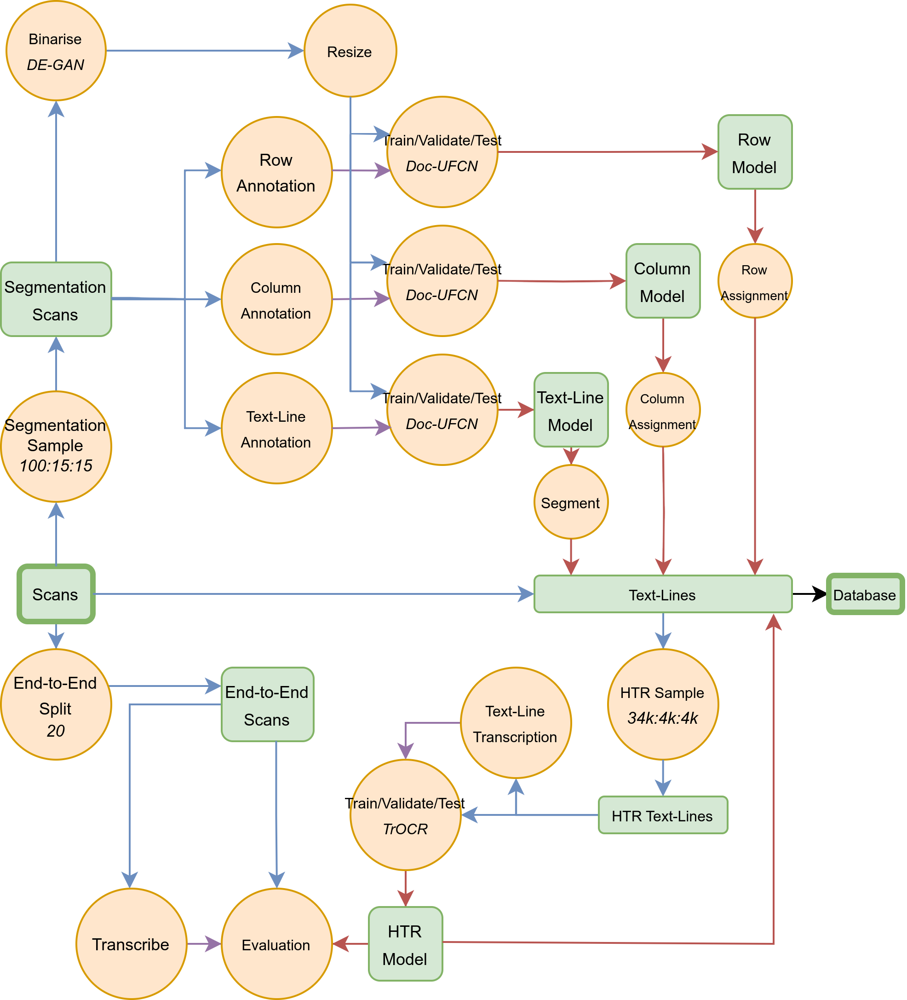

This is a more general map of a pipeline decision tree, not specific to this project. For Test and Validation data (Pre-Processing, Segmentation, or Transcription) nodes summarise procedures already developed on the Train set.

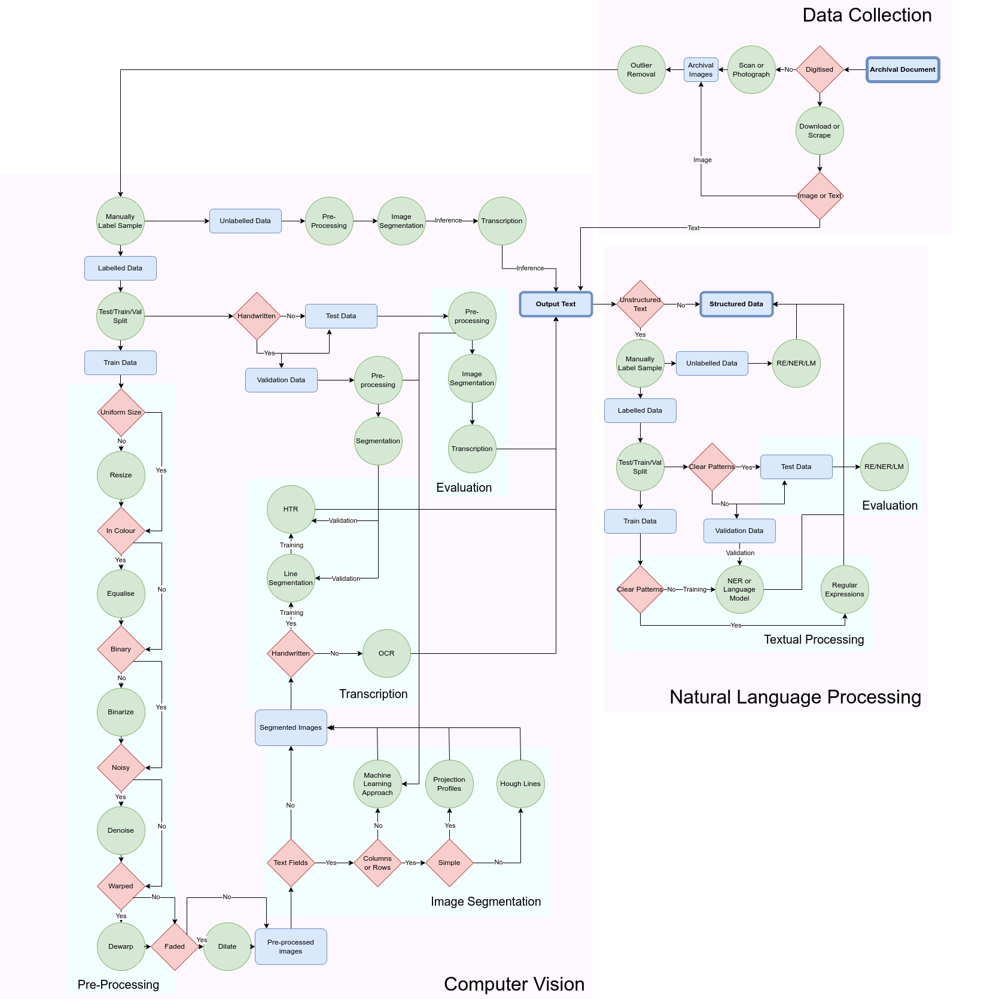

# Citation

If you choose to use material from this workshop for a paper, please cite:

Aurelius Noble and Noah Sutter, 'From Records to Riches: An Automated Pipeline for Transcribing French Tax Records, 1780-1879' (forthcoming).

I will add a link to the working paper soon.

# Feedback

If you want to sign up for future material, or want to give feedback on this workshop, or found any bugs, you can find a feedback form [here](https://forms.gle/ZZmgJQtun5LCeEWt6).